# <span style='font-family:"Times New Roman"'> <span styel=''> **GROUP EXPLORATION**

*Emile Cohen* 
    
*March 2020*

**Goal:** In this notebook, we create subgroups of the cohort, based on their Copy Number State and their mutational profile. For that we create functions to visualize vaf, ccf, purity, 'Expected Number of copies of TP53 mutations' densities but also scatterplots of VAF1/VAF2, CCF1/CCF2 and VAF/CF.
    
The Notebook is divided in 2 parts:
   
* **1. Function Definition**
* **2. Loading Master**
* **3. Group Creation**
* **4. Data Exploration**
* **5. Final Subgroups Analysis**

**NB1:** In each part, you must run the cells from the begining in order to initialize the variables

**NB2:** All functions used for the plots are located in utils/custom_tools.py

---

In [6]:
%run -i '../../utils/setup_environment.ipy'
from utils.analysis_tools import *

import warnings, math
warnings.filterwarnings('ignore')
import ptitprince as pt
import IPython.display

data_path = '../../data/'

Setup environment... done!


<span style="color:green">✅ Working on **mskimpact_env** conda environment.</span>

---
## Function Definition

In this part we define the needed functions to plot summaries of each subgroup.

---

The following *f1, f2* and *f3* allow to recompute the ccf (cancer cell fraction), based on Teng repository Github (https://github.com/papaemmelab/driverclone/blob/master/utils.r#L124-L175)

In [10]:
def f1(x):
    if math.isnan(x.tp53_exp_nb_1):
        return float('NaN')
    else: 
        if x.tp53_exp_nb_1 >= 1 :
            m_star = round(x.tp53_exp_nb_1)
        else : m_star = 1
        return (x.tp53_exp_nb_1/m_star)
    
def f2(x):
    if math.isnan(x.tp53_exp_nb_2):
        return float('NaN')
    else: 
        if x.tp53_exp_nb_2 >= 1 :
            m_star = round(x.tp53_exp_nb_2)
        else : m_star = 1
        return (x.tp53_exp_nb_2/m_star)
    
def f3(x):
    if math.isnan(x.tp53_exp_nb_3):
        return float('NaN')
    else: 
        if x.tp53_exp_nb_3 >= 1 :
            m_star = round(x.tp53_exp_nb_3)
        else : m_star = 1
        return (x.tp53_exp_nb_3/m_star)

---
We define 4 functions that will allow us to print easily the summary report of our subgroups.

1. plot_ccf_vaf
2. plot_scatters
3. plot_purity_numbers
4. plot_copies_tcn

In [11]:
def plot_ccf_vaf(data, group_name):
    
    data_vaf = list(data['tp53_vaf_1']) + list(data['tp53_vaf_2']) + list(data['tp53_vaf_3'])
    data_ccf = list(data['tp53_ccf_1']) + list(data['tp53_ccf_2']) + list(data['tp53_ccf_3'])
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3), sharex=True)
    
    sns.distplot(data_vaf, kde_kws={'clip': (0.0, 1.0), "shade": True}, hist=False, ax=ax1)
    ax1.set_ylabel('Density Estimation')
    ax1.set_xlabel('VAF of TP53 mutations')
    ax1.set_title('VAF Distribution' , weight = 'bold')

    sns.distplot(data_ccf,kde_kws={"shade": True}, hist=False, ax=ax2)
    ax2.set_xlabel('CCF of TP53 mutations')
    ax2.set_title('CCF Distribution', weight = 'bold')
    
    plt.show()

    
    
def plot_scatters(data, txt, group):
    
    data_vaf = data[['tp53_vaf_1', 'tp53_vaf_2', 'tp53_vaf_3']]
    max_table_vaf = pd.DataFrame(np.sort(data_vaf.fillna(0).values)[:,-2:], columns=['2nd-largest','largest'])
    max_table_vaf = pd.concat([max_table_vaf, data.reset_index().tp53_cn_state], axis=1)
    
    data_ccf = data[['tp53_ccf_1', 'tp53_ccf_2', 'tp53_ccf_3']]
    max_table_ccf = pd.DataFrame(np.sort(data_ccf.fillna(0).values)[:,-2:], columns=['2nd-largest','largest'])
    max_table_ccf = pd.concat([max_table_ccf, data.reset_index().tp53_cn_state], axis=1)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), sharex=True)
    
    sns.scatterplot(x='largest', y='2nd-largest', data=max_table_vaf, hue='tp53_cn_state',hue_order=group, ax=ax1, palette="muted")
    ax1.plot([0,1], [0,1], linewidth=0.5, color='grey')
    ax1.set_ylabel('VAF_2')
    ax1.set_xlabel('VAF_1')
    ax1.set_title('VAF' + txt, weight = 'bold')
    
    sns.scatterplot(x='largest', y='2nd-largest', data=max_table_ccf, hue='tp53_cn_state',hue_order=group, ax=ax2, palette="muted")
    ax2.plot([0,1], [0,1], linewidth=0.5, color='grey')
    ax2.set_ylabel('CCF_2')
    ax2.set_xlabel('CCF_1')
    ax2.set_title('CCF' + txt, weight = 'bold')
    
    plt.show()

def plot_purity_cancer(data, group, group_name, mut_cn_group=False): 
        f, axs = plt.subplots(1, 2, figsize=(14, 4))
        f.suptitle(group_name+' SUMMARY', fontsize=16, weight = 'bold')
        ax1 = axs[0]
        sns.distplot(data['purity'], hist=False,kde_kws={'clip': (0.0, 1.0), "shade": True}, ax=ax1)
        ax1.set_xlim([0,1])
        ax1.set_xlabel('Purity')
        ax1.set_ylabel('Density Estimation')
        ax1.set_title('Purity', weight = 'bold')

        ax2 = axs[1]
        data_cancer = pd.DataFrame(get_groupby(data, 'Cancer_Type', 'count')).sort_values(by=['count'], ascending=False).head(10)
        sns.barplot(y='count', x=data_cancer.index, data=data_cancer, ax=ax2, color=plt.cm.Blues(0.4))
        ax2.set_xlabel('Cancer Types')
        ax2.set_ylabel('# of Samples')
        ax2.set_xticklabels(ax2.get_xticklabels(), rotation=40, ha="right")
        ax2.set_title('Cancer Type Distribution', weight = 'bold')

def plot_copies_tcn(data, group, group_name, nb_muts):
    data = filter_muts(data, nb_muts)
    data_1 =  pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_1']])
    data_1.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_2 = pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_2']])
    data_2.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_3 = pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_3']])
    data_3.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_4 = pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_4']])
    data_4.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_5 = pd.DataFrame(data[['Tumor_Id','tp53_exp_nb_5']])
    data_5.columns = ['Tumor_Id', 'tp53_exp_nb']
    data_tot = data_1.append(data_2)
    data_tot = data_tot.append(data_3)
    data_tot = data_tot.append(data_4)
    data_tot = data_tot.append(data_5)
    
    data_tot = pd.merge(left=data_tot, right=data[['Tumor_Id','tp53_cn_state', 'tp53_tcn']],how='left', left_on='Tumor_Id',right_on='Tumor_Id')

    dx="tp53_tcn"; dy="tp53_exp_nb"; ort="h"; pal = "muted"; sigma = .2; dhue = "tp53_cn_state"; dhue_order=group
    f, ax = plt.subplots(figsize=(15, 10))
    
    # Little trick for indeterminate group
    if group_name == 'INDETERMINATE':
        ax=pt.RainCloud(x = dx, y = dy, data = data_tot, palette = pal, bw = sigma,
                 width_viol = .6, ax = ax, orient = ort, alpha=.6, mv=.2)
    else:
        ax=pt.RainCloud(x = dx, y = dy, data = data_tot, palette = pal, bw = sigma, hue=dhue, hue_order=dhue_order,
                 width_viol = .6, ax = ax, orient = ort, alpha=.6, mv=.2)
    ax.set_ylabel('Total Copy Number')
    ax.set_xlabel('Expected number of copies of Tp53 mutations')
    ax.set_title(group_name, weight = 'bold')

Finally, we define *plot_summary* that uses the functions above to compute a visual summary of the group

In [42]:
def plot_summary(group: list, group_name: str, nb_muts_density=[1,2,3], nb_muts_scatter=[2,3], mut_cn_group=False, sample_type=False):
    
    sns.set_style("whitegrid", {'grid.color': '1'})
    sns.despine(top=True, right=True, left=False, bottom=False)
    
    master_cutoff = master[master['purity'] > 0.25]
    master_cutoff.drop( master_cutoff[master_cutoff['tp53_group'] == '1_WILD_TYPE'][master_cutoff['purity'] <= 0.32].index , inplace=True)
    
    # DENSITY PLOTS
    master_density = filter_muts(master_cutoff, nb_muts_density)
    
    # Plot Purity distribution and cancer distribution
    plot_purity_cancer(master_density, group, group_name, mut_cn_group)
    
    # Plot vaf and ccf densities
    if mut_cn_group:
        master_density = filter_general(master_density, 'tp53_group', group)
        #display(master_density)
    else: master_density = filter_cn_state(master_density, group)

    sns.set_palette("muted", len(set(master_density.tp53_cn_state)),1)
    
    display_side_by_side(get_groupby(master_density, 'tp53_cn_state', 'count'),get_groupby(master_density, 'Cancer_Type', 'count').sort_values(by=['count'], ascending=False).head(15),get_groupby(master_density, 'tp53_count', 'count'))
    plot_ccf_vaf(master_density, group_name)
    
    # SCATTER PLOTS
    if nb_muts_scatter != 0:
        master_scatter = filter_muts(master_cutoff, nb_muts_scatter)
        if mut_cn_group:
            master_scatter = filter_general(master_scatter, 'tp53_group', group)
            group = list(set(master_scatter.tp53_cn_state))
        else: 
            master_scatter = filter_cn_state(master_scatter, group)
        
        plot_scatters(master_scatter, '', group)
        
        # Metastasis VS Primary
        if sample_type:
            master_scatter_prim = master_scatter[master_scatter['Sample_Type'] == 'Primary']
            master_scatter_met = master_scatter[master_scatter['Sample_Type'] == 'Metastasis']
            plot_scatters(master_scatter_prim, ' - Primary Samples', group)
            plot_scatters(master_scatter_met, ' - Metastatic Samples', group)
    
    
    # Plot number of mut copies VS tcn 
    cn_state_group = list(set(master_density.tp53_cn_state))
    plot_copies_tcn(master_density, cn_state_group, group_name, [1,2,3,4,5])

---
## Loading Master

We load the master file and create 3 new columns: for each mutation we compute a Cancer Cell Fraction (CCF), from the Lab Github. This CCF is uncapped and go above 1, contrary to the one given in the Facets output.

In [5]:
# LOADING THE MASTER FILE
master = pd.read_pickle(data_path + 'merged_data/master_file.pkl')

master['tp53_ccf_comp_1'] = master.apply(f1, axis = 1)
master['tp53_ccf_comp_2'] = master.apply(f2, axis = 1)
master['tp53_ccf_comp_3'] = master.apply(f3, axis = 1)

master.head()

,Sample_Id,Tumor_Id,Patient_Id,Cancer_Type,Cancer_Type_Detailed,Sample_Type,purity,ploidy,samples_per_patient,Overall Survival Status,Overall Survival (Months),MSI Score,TMB_Score,tp53_key_1,tp53_vc_1,tp53_ccf_1,tp53_vaf_1,tp53_HGVSp_1,tp53_spot_1,tp53_key_2,tp53_vc_2,tp53_ccf_2,tp53_vaf_2,tp53_HGVSp_2,tp53_spot_2,tp53_key_3,tp53_vc_3,tp53_ccf_3,tp53_vaf_3,tp53_HGVSp_3,tp53_spot_3,tp53_key_4,tp53_vc_4,tp53_ccf_4,tp53_vaf_4,tp53_HGVSp_4,tp53_spot_4,tp53_key_5,tp53_vc_5,tp53_ccf_5,tp53_vaf_5,tp53_HGVSp_5,tp53_spot_5,tp53_count,tp53_tcn,tp53_mcn,tp53_lcn,tp53_seg_length,tp53_cn_state,cf,wgd,mutation_count,gene_count,max_vaf,tp53_exp_nb_1,tp53_exp_nb_2,tp53_exp_nb_3,tp53_exp_nb_4,tp53_exp_nb_5,tp53_first_group,tp53_group,chr_affected,chr_loss,chr_gain,chr_cnloh,frac_genome_altered,tp53_vc_group_1,tp53_vc_group_2,tp53_vc_group_3,tp53_vc_group_4,tp53_vc_group_5,tp53_ccf_comp_1,tp53_ccf_comp_2,tp53_ccf_comp_3
0,P-0034223-T01-IM6_P-0034223-N01-IM6,P-0034223-T01-IM6,P-0034223,Breast Cancer,Invasive Breast Carcinoma,Metastasis,0.941111,2.241830,1.0,LIVING,NaN,0.55,5.3,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,2.0,1.0,1.0,80668592.0,DIPLOID,1.000000,-1.0,6,6.0,0.901899,NaN,NaN,NaN,NaN,NaN,WILD_TYPE,None,3,2,2,0,0.080,None,None,None,None,None,NaN,NaN,NaN
1,P-0009819-T01-IM5_P-0009819-N01-IM5,P-0009819-T01-IM5,P-0009819,Prostate Cancer,Prostate Adenocarcinoma,Primary,0.275237,2.681075,1.0,LIVING,23.441,0.00,1.0,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,1.0,1.0,0.0,80668309.0,HETLOSS,0.154578,-1.0,3,3.0,0.148014,NaN,NaN,NaN,NaN,NaN,LOSS,0_HETLOSS,4,4,0,0,0.137,None,None,None,None,None,NaN,NaN,NaN
2,P-0025956-T01-IM6_P-0025956-N01-IM6,P-0025956-T01-IM6,P-0025956,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,Primary,0.185874,3.496971,1.0,DECEASED,3.584,0.00,5.3,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,6.0,0.200000,NaN,NaN,NaN,NaN,NaN,None,None,0,0,0,0,NaN,None,None,None,None,None,NaN,NaN,NaN
3,P-0027408-T01-IM6_P-0027408-N01-IM6,P-0027408-T01-IM6,P-0027408,Non-Small Cell Lung Cancer,Non-Small Cell Lung Cancer,Metastasis,0.308886,1.811066,1.0,LIVING,22.586,0.27,17.6,P-0027408-T01-IM6_17_7578409_CT_TC,Missense_Mutation,0.925,0.168901,p.Arg174Glu,174,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,1,1.0,1.0,0.0,25260272.0,HETLOSS,0.315621,-1.0,21,19.0,0.192475,0.924711,NaN,NaN,NaN,NaN,LOSS,>=1_LOSS,12,11,3,0,0.452,missense,None,None,None,None,0.924711,NaN,NaN
4,P-0006554-T01-IM5_P-0006554-N01-IM5,P-0006554-T01-IM5,P-0006554,Glioma,Anaplastic Oligodendroglioma,Primary,0.715208,1.910719,1.0,LIVING,26.170,1.30,46.2,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,None,None,NaN,NaN,None,None,0,2.0,NaN,NaN,7465132.0,INDETERMINATE,NaN,NaN,47,39.0,0.706897,NaN,NaN,NaN,NaN,NaN,None,None,5,4,1,0,0.173,None,None,None,None,None,NaN,NaN,NaN


---
## Group Creation

We defined these two sets of cn_state groups earlier in the work, when we wanted to discover the data. The last one is in **Data Exploration** part, with the summary plots associated.

In [13]:
# Groups definition
WT_present = ['DIPLOID', 'TETRAPLOID', 'LOSS AFTER', 'DOUBLE LOSS AFTER']
loh = ['CNLOH', 'CNLOH BEFORE & LOSS', 'CNLOH AFTER', 'CNLOH BEFORE', 'CNLOH & GAIN', 'CNLOH BEFORE & GAIN', 'AMP (LOH)']
loss_withorwithout_WT = ['HETLOSS', 'LOSS BEFORE', 'HOMDEL', 'LOSS BEFORE & AFTER']
gain = ['GAIN', 'AMP', 'AMP (BALANCED)', 'LOSS & GAIN']

In [14]:
# Groups definition
CNLOH = ['CNLOH', 'CNLOH BEFORE & LOSS', 'CNLOH AFTER', 'CNLOH BEFORE', 'CNLOH & GAIN', 'CNLOH BEFORE & GAIN', 'AMP (LOH)']
LOSS = ['HETLOSS', 'LOSS BEFORE', 'LOSS AFTER', 'HOMDEL', 'LOSS BEFORE & AFTER', 'DOUBLE LOSS AFTER']
GAIN = ['GAIN', 'AMP', 'AMP (BALANCED)', 'LOSS & GAIN']
DI_TETRA = ['DIPLOID', 'TETRAPLOID']
indeterminate = ['INDETERMINATE', '']
total = CNLOH + LOSS + GAIN + DI_TETRA

,count
tp53_cn_state,
AMP,12
AMP (BALANCED),4
GAIN,91
LOSS & GAIN,15
,count
Cancer_Type,
Non-Small Cell Lung Cancer,20
Glioma,15
Colorectal Cancer,14


<Figure size 600x600 with 0 Axes>

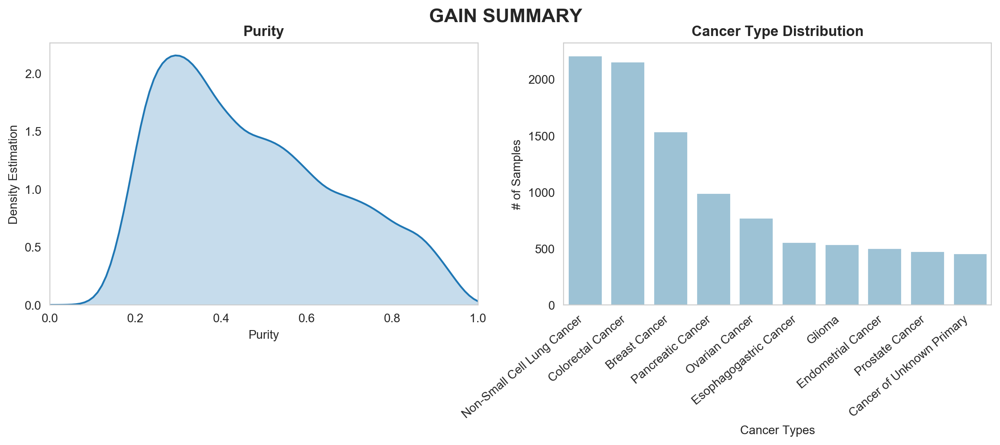

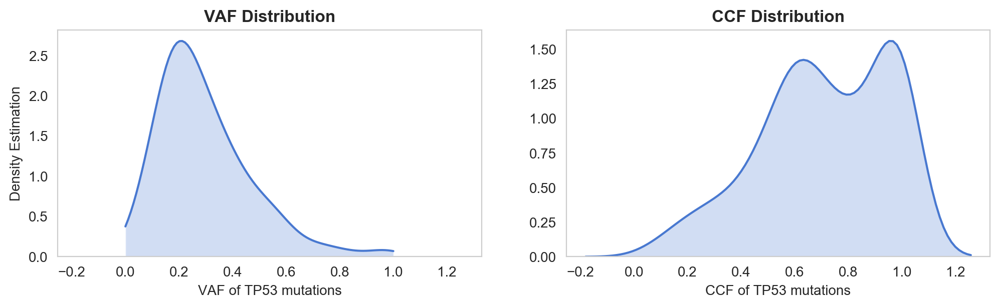

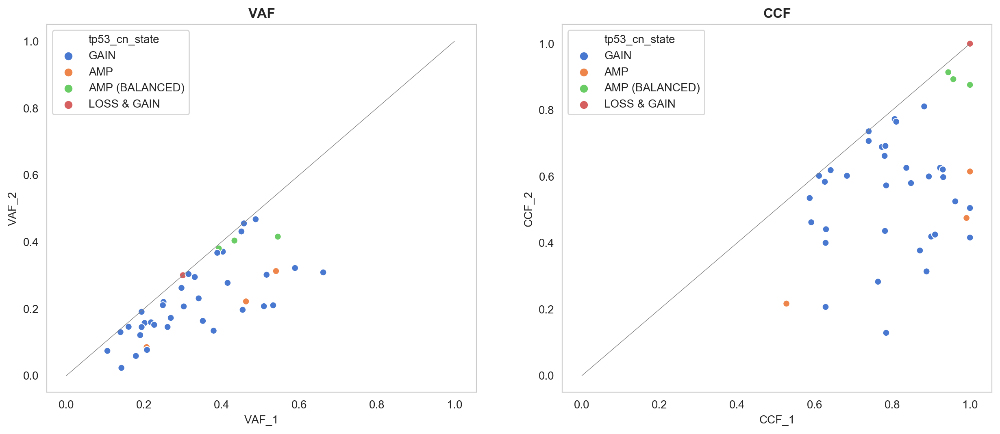

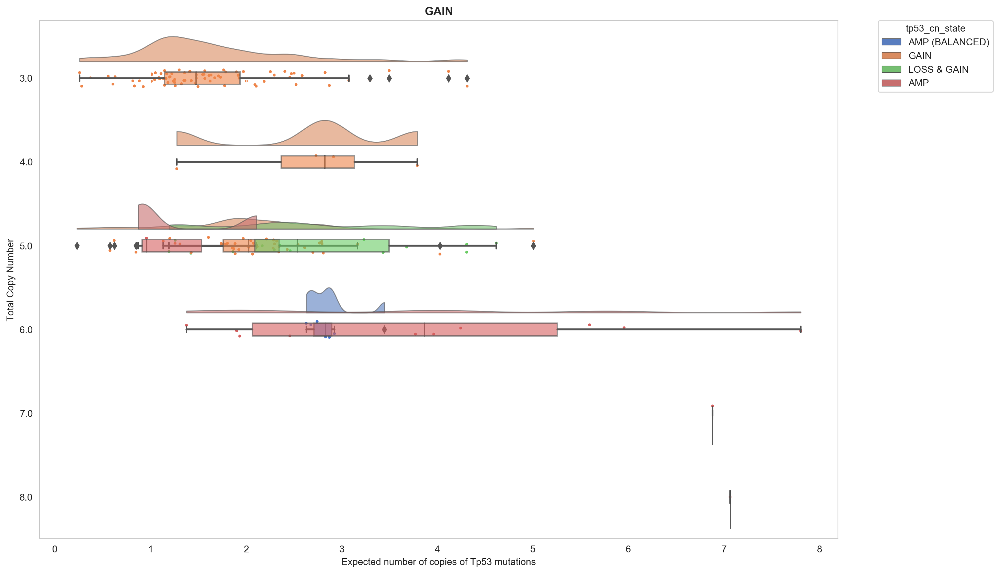

In [15]:
plot_summary(GAIN,'GAIN')

---
## Data Exploration

Skip This Part to see directly the final subgroups.

Here we have the exploratory groups that we defined previously and allowed us to define the final subgroups.
Each plot is done with the following parameters:
* *nb_muts_density* = [1,2,3] is the number of tp53 mutations we selected to plot the densities (vaf, ccf, purity)
* *nb_muts_scatter* = [2,3] is the number of tp53 mutations we selected to plot the scatters (VAF1/VAF2 and CCF1/CCF2)
* For the plot of expected number of tp53 mutations copies, we selected only 1 mutation samples

In [16]:
# Group Definition
WT_allele = ['LOSS AFTER', 'DIPLOID', 'TETRAPLOID']
LOSS_noWT = ['LOSS BEFORE', 'HETLOSS', 'LOSS BEFORE & AFTER']
LOH_noWT = ['CNLOH', 'CNLOH BEFORE & LOSS', 'CNLOH BEFORE', 'CNLOH BEFORE & GAIN']
GAIN_WT = ['AMP', 'GAIN','LOSS & GAIN']
AMBIGUOUS = ['CNLOH AFTER', 'DOUBLE LOSS AFTER']
MISSING = ['HOMDEL', 'AMP (BALANCED)', 'AMP (LOH)']
indeterminate = ['INDETERMINATE', '']

,count
tp53_cn_state,
DIPLOID,1711
LOSS AFTER,271
TETRAPLOID,82
,count
Cancer_Type,
Non-Small Cell Lung Cancer,413
Colorectal Cancer,298
Glioma,179
Pancreatic Cancer,149


<Figure size 600x600 with 0 Axes>

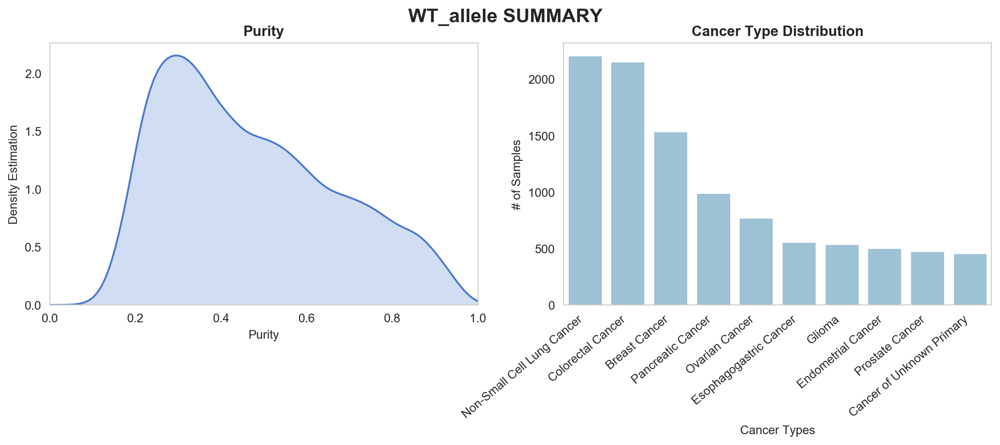

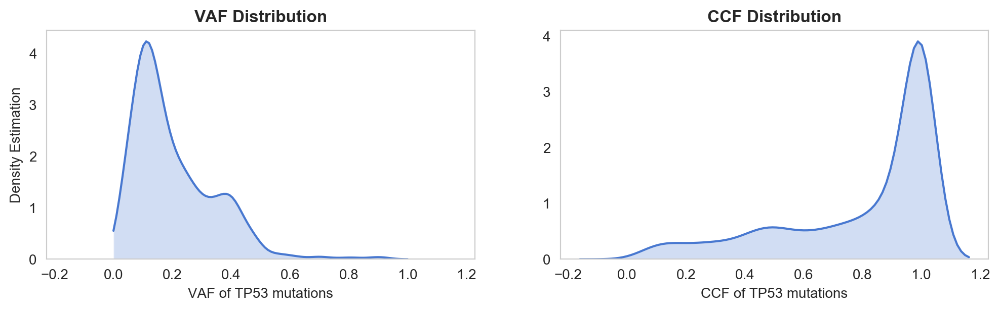

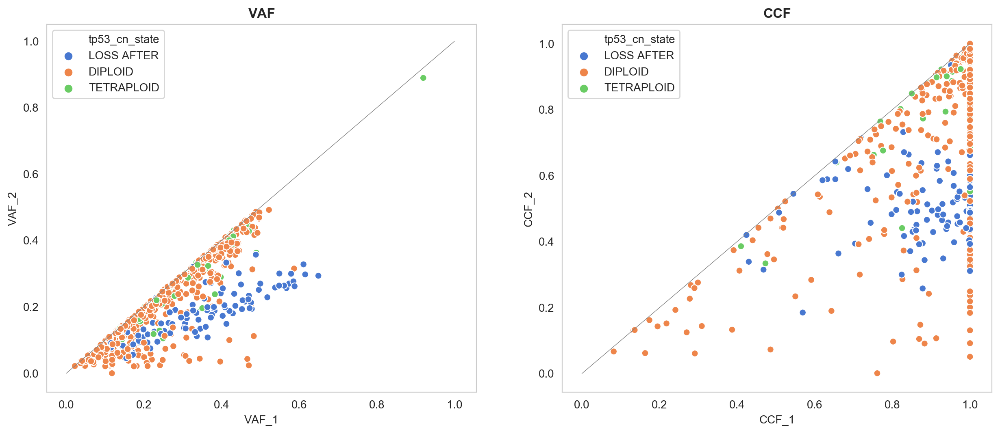

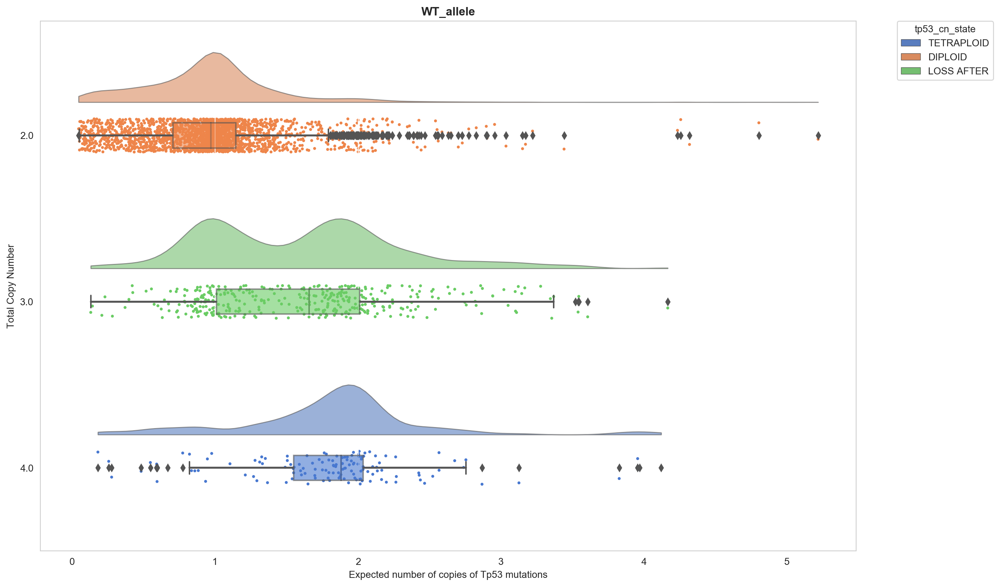

In [17]:
plot_summary(WT_allele,'WT_allele')

,count
tp53_cn_state,
HETLOSS,3727
LOSS BEFORE,3131
LOSS BEFORE & AFTER,226
,count
Cancer_Type,
Colorectal Cancer,1361
Non-Small Cell Lung Cancer,1158
Breast Cancer,1004
Pancreatic Cancer,687


<Figure size 600x600 with 0 Axes>

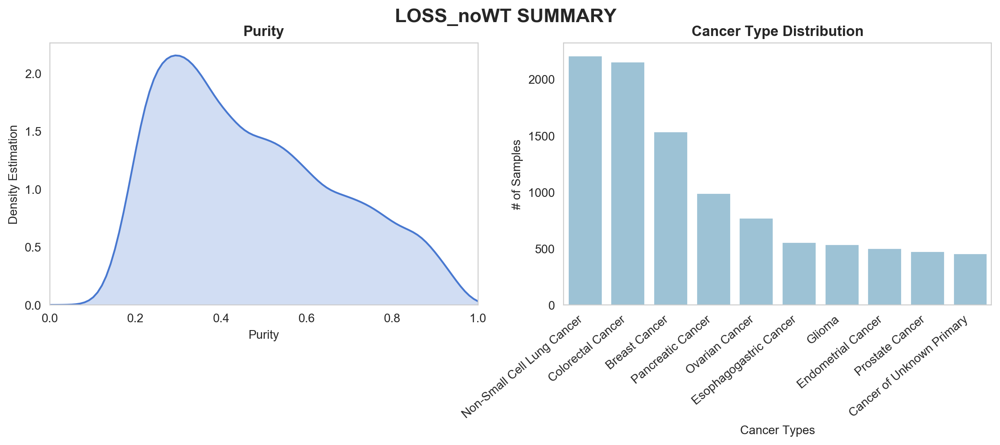

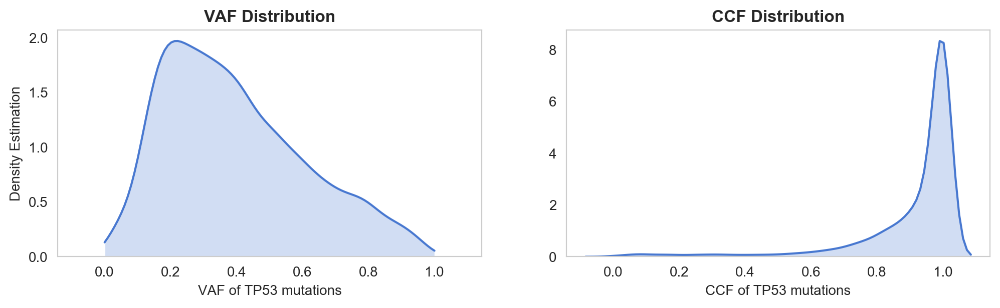

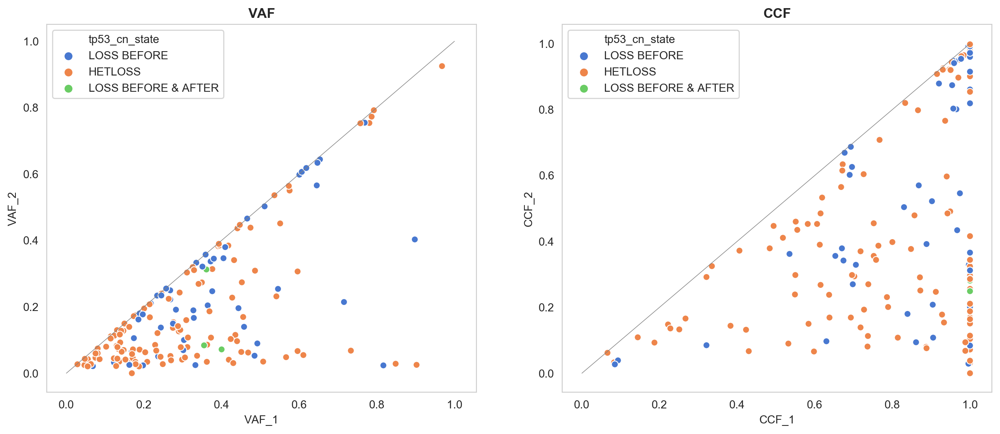

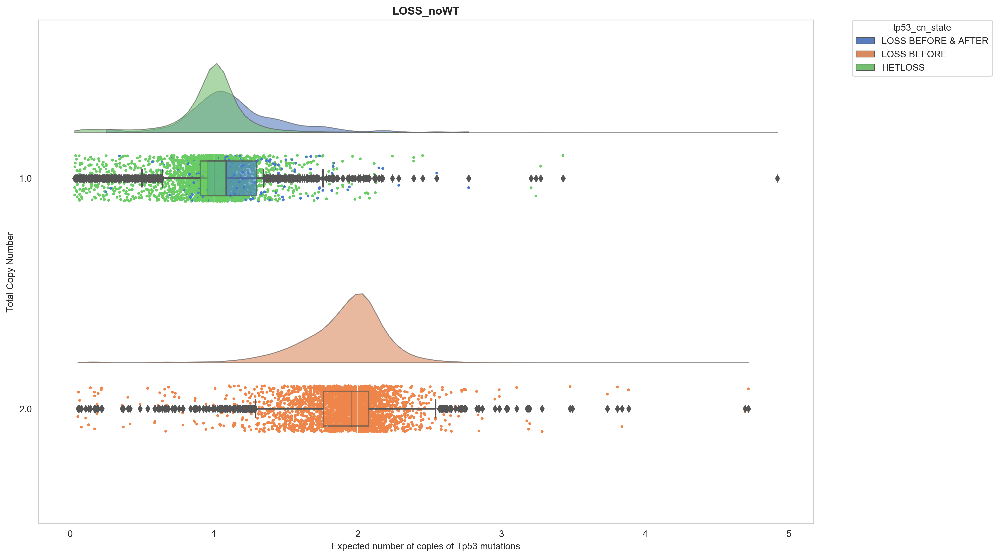

In [18]:
plot_summary(LOSS_noWT,'LOSS_noWT')

In [19]:
plot_summary(LOH,'LOH_noWT')

NameError: name 'LOH' is not defined

,count
tp53_cn_state,
AMP,12
GAIN,91
LOSS & GAIN,15
,count
Cancer_Type,
Non-Small Cell Lung Cancer,20
Glioma,14
Colorectal Cancer,14
Esophagogastric Cancer,10


<Figure size 600x600 with 0 Axes>

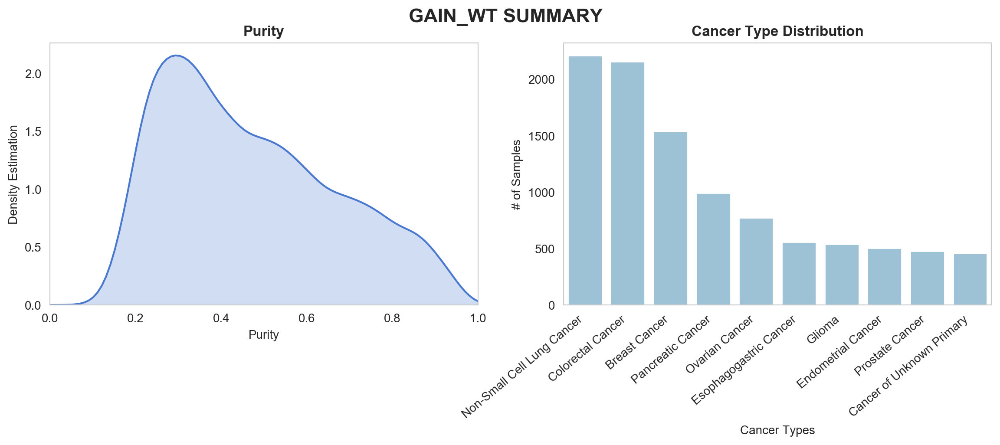

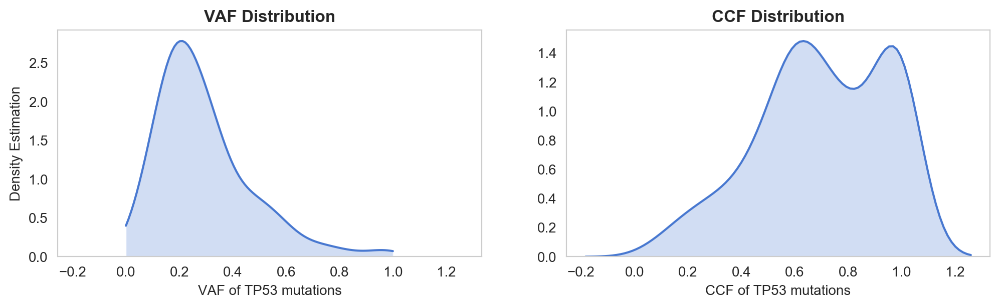

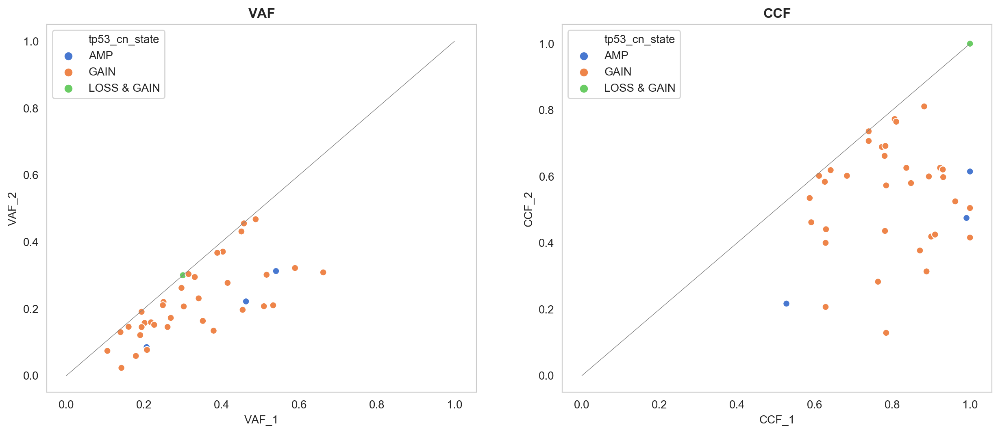

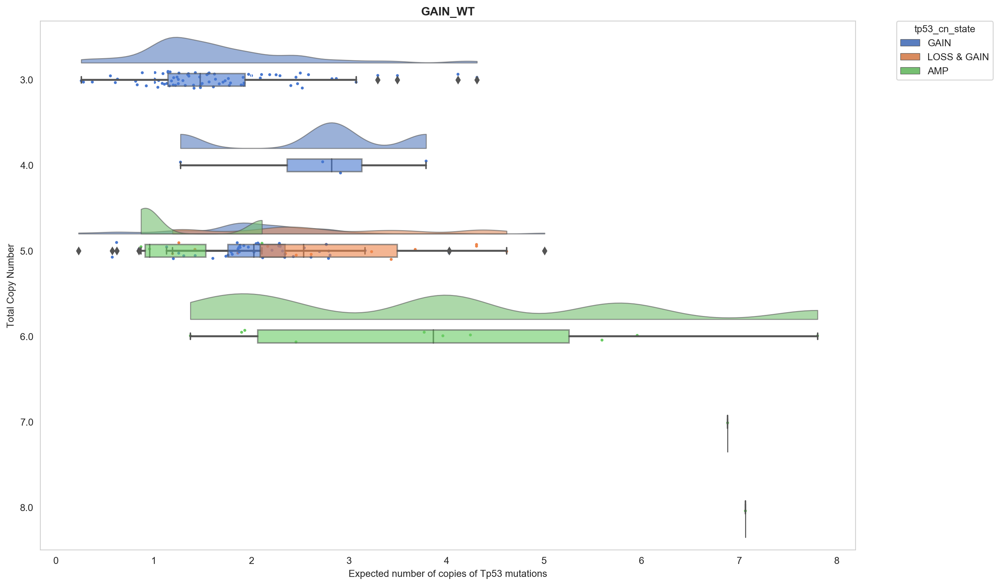

In [20]:
plot_summary(GAIN_WT,'GAIN_WT')

,count
tp53_cn_state,
CNLOH AFTER,43
DOUBLE LOSS AFTER,149
,count
Cancer_Type,
Non-Small Cell Lung Cancer,52
Colorectal Cancer,38
Breast Cancer,18
Bladder Cancer,11
Esophagogastric Cancer,11


<Figure size 600x600 with 0 Axes>

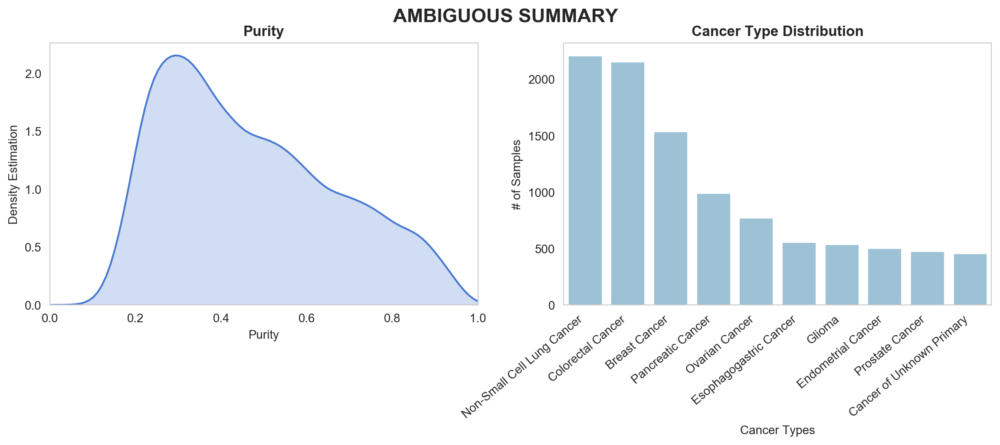

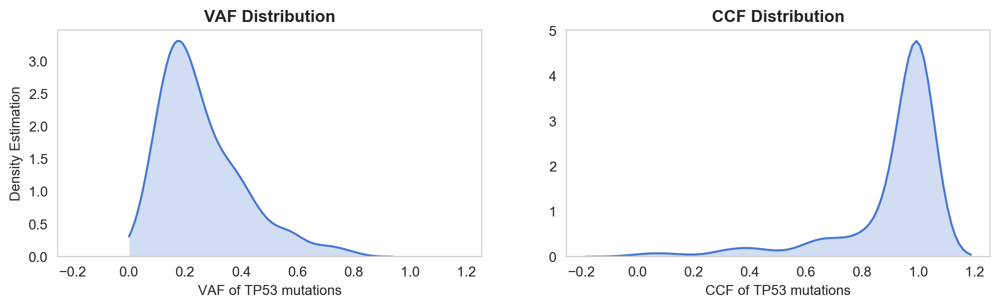

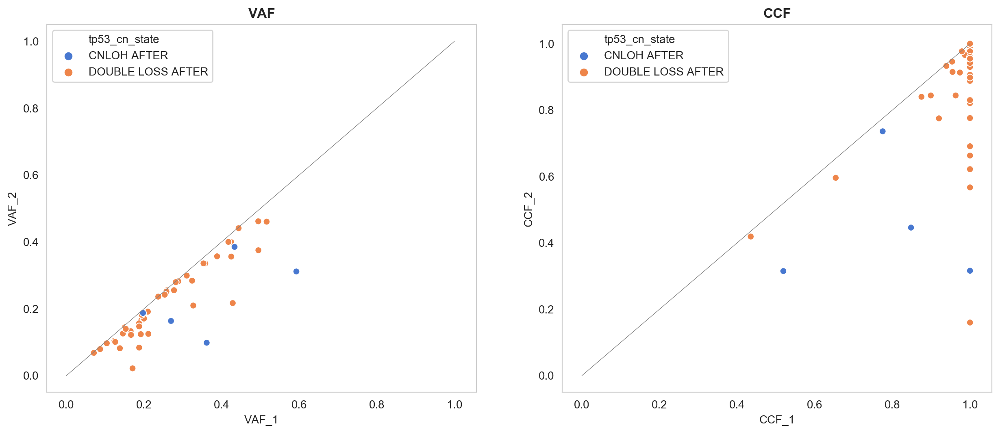

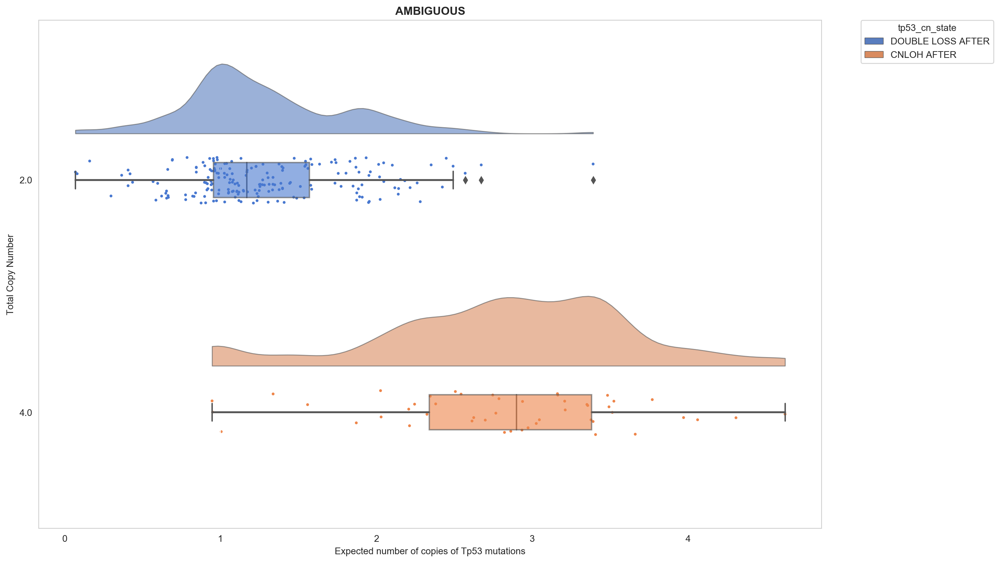

In [21]:
plot_summary(AMBIGUOUS,'AMBIGUOUS')

,count
tp53_cn_state,
AMP (BALANCED),4
AMP (LOH),12
HOMDEL,71
,count
Cancer_Type,
Prostate Cancer,14
Breast Cancer,11
Colorectal Cancer,9
Pancreatic Cancer,8


<Figure size 600x600 with 0 Axes>

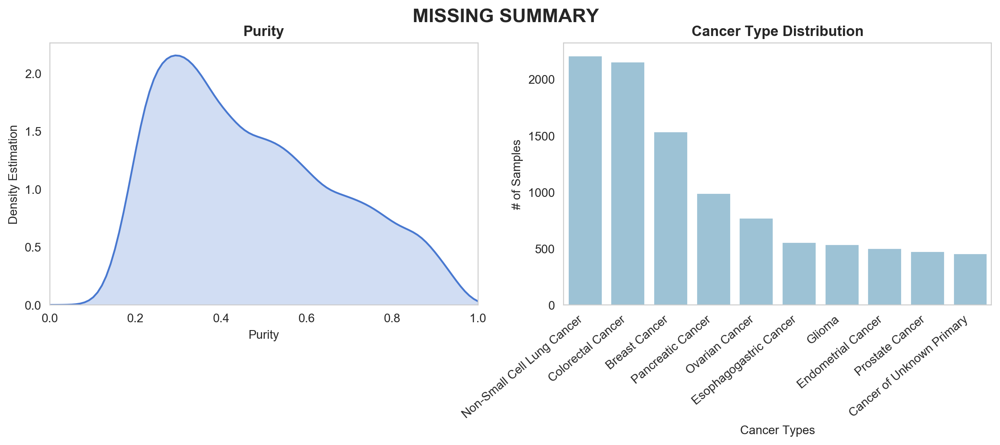

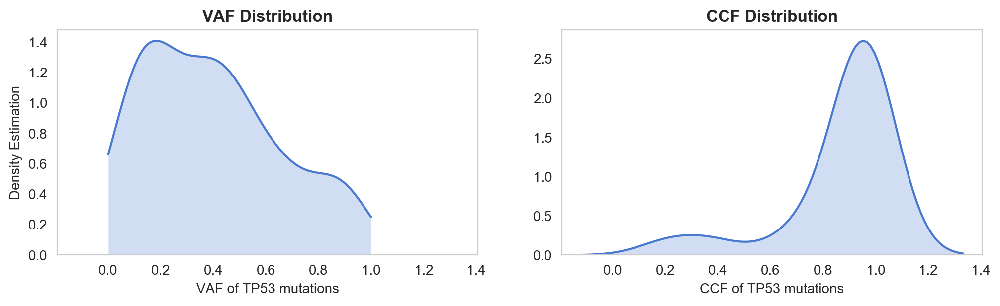

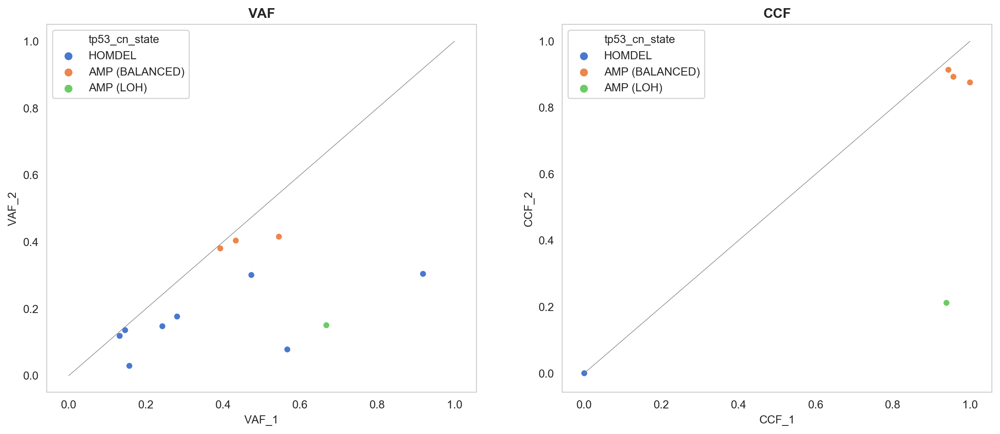

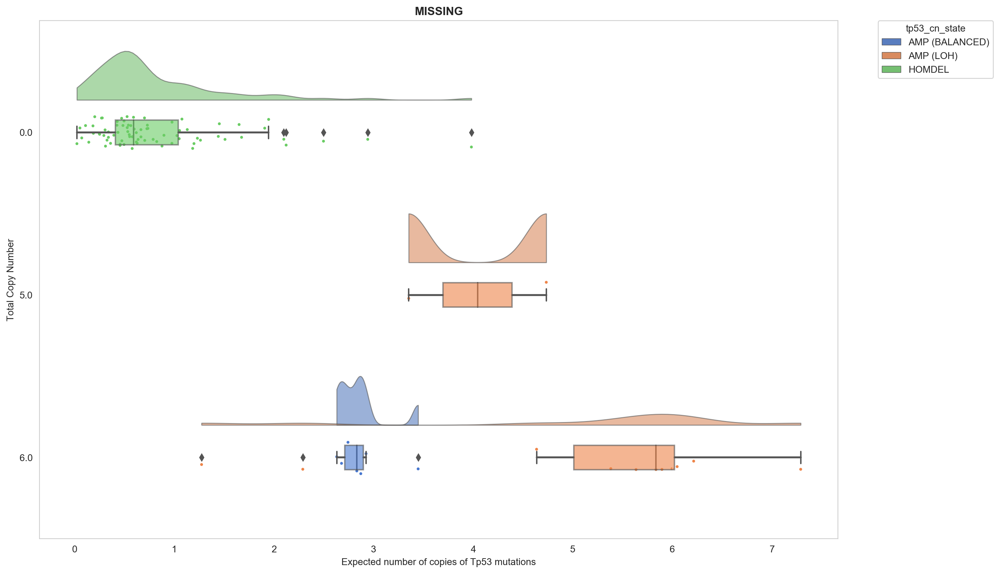

In [22]:
plot_summary(MISSING,'MISSING')

,count
tp53_cn_state,
INDETERMINATE,1207
,count
Cancer_Type,
Non-Small Cell Lung Cancer,207
Colorectal Cancer,147
Breast Cancer,139
Ovarian Cancer,112
Glioma,72
Pancreatic Cancer,67


<Figure size 600x600 with 0 Axes>

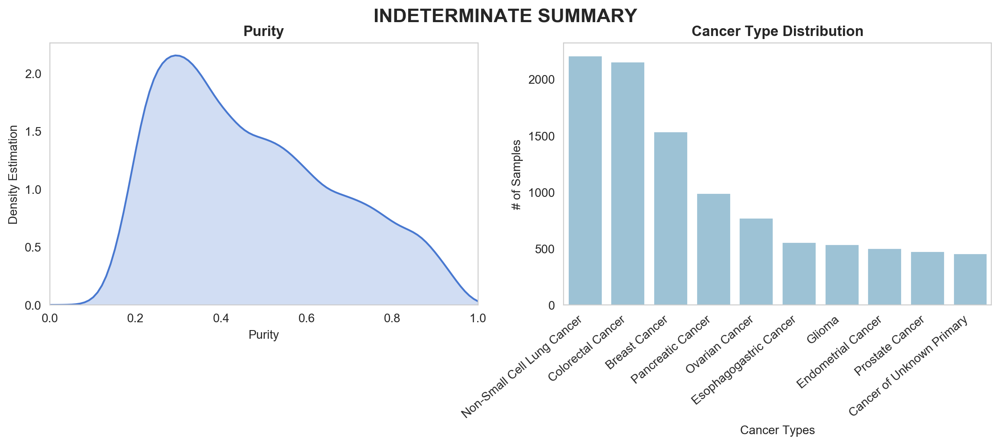

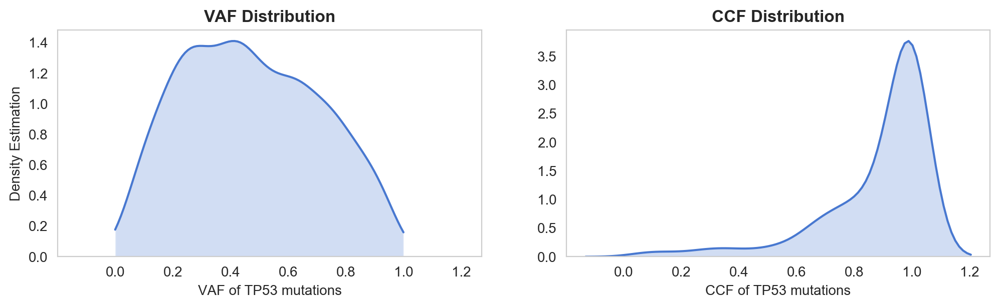

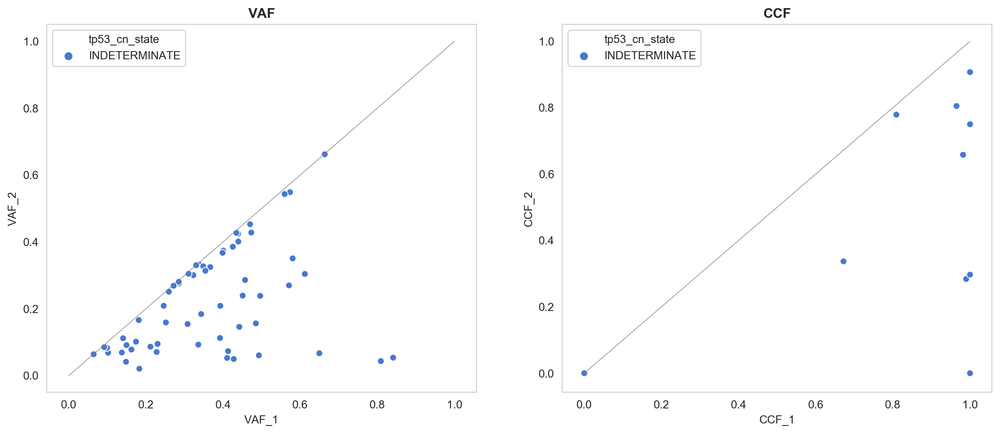

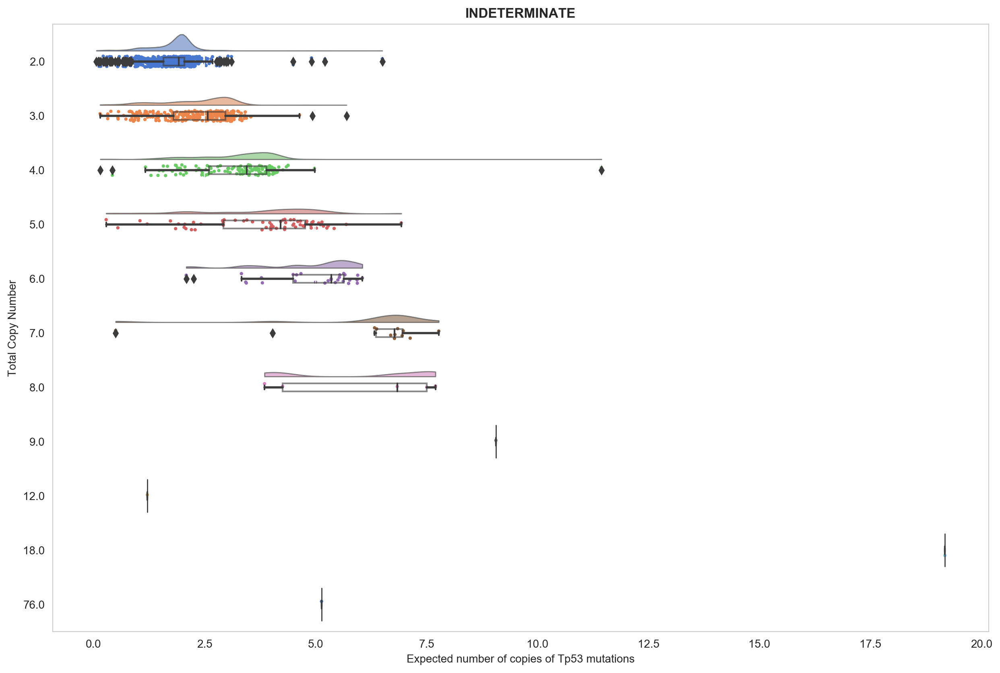

In [23]:
plot_summary(indeterminate, 'INDETERMINATE')

In [26]:
master_density = filter_cn_state(master, indeterminate)
master_density = filter_muts(master_density, [1])
master_density[master_density['tp53_tcn'] == 2]['tp53_exp_nb_1'].describe()

count    671.000000
mean       1.829717
std        0.523884
min        0.063210
25%        1.653953
50%        1.930245
75%        2.051711
max        6.503884
Name: tp53_exp_nb_1, dtype: float64

---
## Final Subgroups Analysis

First, we perform a general analysis on the subgroups without entering the metrics of each one. 
The first questions that have arisen are:
* How big are the subgroups?
* What percentage of the tp53 samples do they represent?
* What is the distribution of mutations within eah group?
* What is the distribution of sample types (Metastasis, Primary) within eah group?
* What are the main Cancers represented by group?


---
* **How big are the subgroups?** In comparison with the entire cohort, in comparison with tp53 positive samples

---
* **How big are the subgroups?** 
* **What is the distribution of mutations within eah group?**
* **What is the distribution of sample types (Metastasis, Primary) within eah group?**
* **What are the main Cancers represented by group?**


count 
 
 
 tp53_group 
 
 
 
 
 
 >=1_LOSS 
 7087 
 
 
 0_HETLOSS 
 2833 
 
 
 >=1_cnLOH 
 1895 
 
 
 1_WILD_TYPE 
 1457 
 
 
 >1muts 
 697 
 
 
 HOMDEL 
 296 
 
 
 
 
 
 
 
 count 
 
 
 tp53_group 
 tp53_count 
 
 
 
 
 
 0_HETLOSS 
 0 
 2833 
 
 
 1_WILD_TYPE 
 1 
 1457 
 
 
 >1muts 
 2 
 616 
 
 
 3 
 68 
 
 
 4 
 10 
 
 
 5 
 3 
 
 
 >=1_LOSS 
 1 
 6904 
 
 
 2 
 161 
 
 
 3 
 19 
 
 
 4 
 3 
 
 
 >=1_cnLOH 
 1 
 1850 
 
 
 2 
 39 
 
 
 3 
 6 
 
 
 HOMDEL 
 0 
 224 
 
 
 1 
 63 
 
 
 2 
 8 
 
 
 4 
 1 
 
 
 
 
 
 
 
 count 
 
 
 tp53_group 
 Sample_Type 
 
 
 
 
 
 0_HETLOSS 
 Metastasis 
 1260 
 
 
 Primary 
 1556 
 
 
 1_WILD_TYPE 
 Metastasis 
 494 
 
 
 Primary 
 963 
 
 
 >1muts 
 Metastasis 
 232 
 
 
 Primary 
 465 
 
 
 >=1_LOSS 
 Metastasis 
 3271 
 
 
 Primary 
 3816 
 
 
 >=1_cnLOH 
 Metastasis 
 821 
 
 
 Primary 
 1074 
 
 
 HOMDEL 
 Metastasis 
 116 
 
 
 Primary 
 179 
 
 
 
 
 
 
 
 count 
 
 
 tp53_group 
 Cancer_Type 
 
 
 
 
 
 0_HETLOSS 
 Breast Cancer 
 864 
 
 
 Non-Small Cell Lung Cancer 
 347 
 
 
 Prostate Cancer 
 254 
 
 
 1_WILD_TYPE 
 Non-Small Cell Lung Cancer 
 322 
 
 
 Colorectal Cancer 
 198 
 
 
 Pancreatic Cancer 
 142 
 
 
 >1muts 
 Colorectal Cancer 
 116 
 
 
 Non-Small Cell Lung Cancer 
 110 
 
 
 Glioma 
 101 
 
 
 >=1_LOSS 
 Colorectal Cancer 
 1361 
 
 
 Non-Small Cell Lung Cancer 
 1158 
 
 
 Breast Cancer 
 1005 
 
 
 >=1_cnLOH 
 Non-Small Cell Lung Cancer 
 348 
 
 
 Colorectal Cancer 
 281 
 
 
 Breast Cancer 
 237 
 
 
 HOMDEL 
 Soft Tissue Sarcoma 
 47 
 
 
 Breast Cancer 
 41 
 
 
 Prostate Cancer 
 34

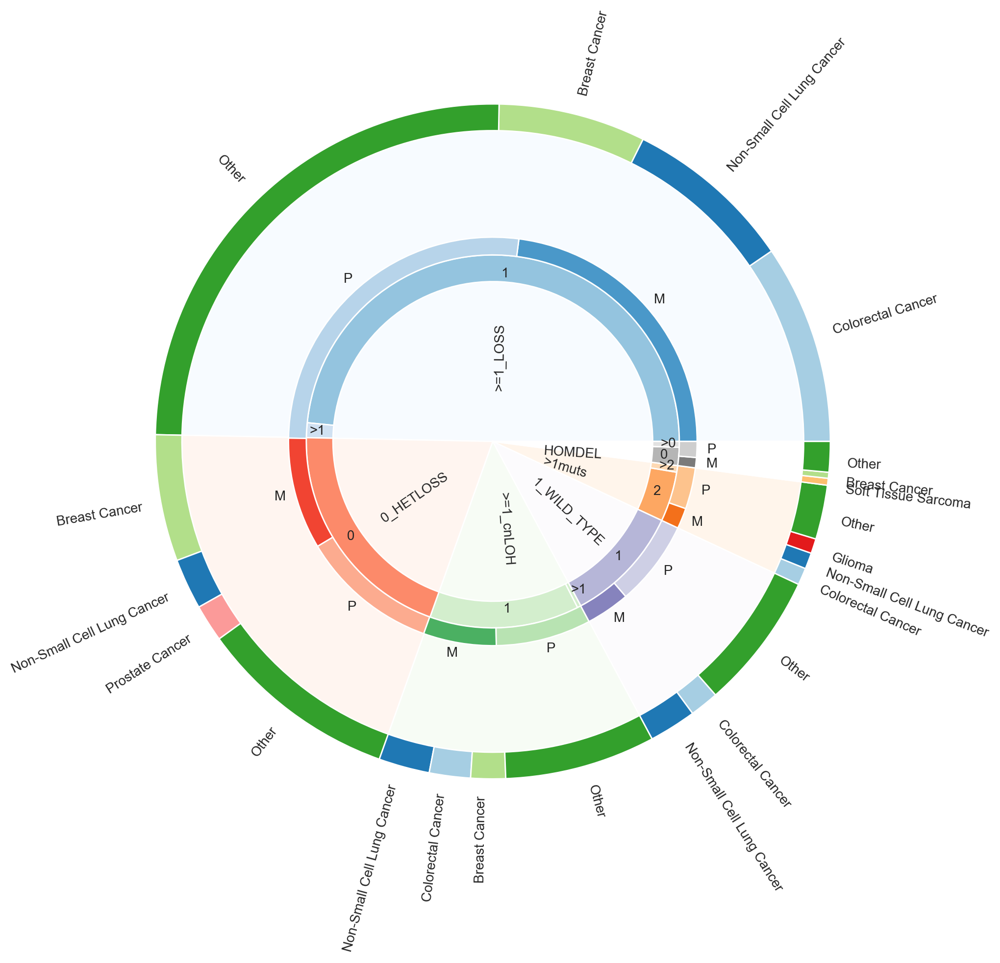

In [27]:
mut_tp53_count = pd.DataFrame(master[['tp53_group', 'tp53_count']].groupby(
    ['tp53_group', 'tp53_count'], sort=True).size())
mut_tp53_count.columns = ['count']

group_sample_count = pd.DataFrame(master[['tp53_group',
                                          'Sample_Type']].groupby(
                                              ['tp53_group', 'Sample_Type'],
                                              sort=True).size())
group_sample_count.columns = ['count']

# We select the 3 biggest cancers per subgroup.
cancers_per_group = pd.DataFrame(master[['tp53_group',
                                         'Cancer_Type']].groupby(
                                             ['tp53_group', 'Cancer_Type'],
                                             sort=True).size())
cancers_per_group.columns = ['count']
cancers_per_group = cancers_per_group['count'].groupby(level=0,
                                                       group_keys=False)
cancers_per_group = cancers_per_group.apply(
    lambda x: x.sort_values(ascending=False).head(3))

group_names = [
    '>=1_LOSS', '0_HETLOSS', '>=1_cnLOH', '1_WILD_TYPE', '>1muts', 'HOMDEL'
]
group_size = sorted(list(
    mut_tp53_count.groupby(['tp53_group']).sum()['count']),
                    reverse=True)

subgroup_size = [6904, 183, 2833, 1850, 45, 1457, 616, 81, 224, 72]
subgroup_names = [1, '>1', 0, 1, '>1', 1, 2, '>2', 0, '>0']

sample_size = [3271, 3816, 1260, 1556, 821, 1074, 494, 963, 232, 465, 116, 179]
sample_names = ['M', 'P', 'M', 'P', 'M', 'P', 'M', 'P', 'M', 'P', 'M', 'P']

cancer_size = [
    1361, 1158, 1005, 3563, 864, 347, 254, 1368, 348, 281, 237, 1029, 322, 198,
    937, 116, 110, 101, 370, 47, 41, 208
]

cancer_names = [
    'Colorectal Cancer', 'Non-Small Cell Lung Cancer', 'Breast Cancer',
    'Other', 'Breast Cancer', 'Non-Small Cell Lung Cancer', 'Prostate Cancer',
    'Other', 'Non-Small Cell Lung Cancer', 'Colorectal Cancer',
    'Breast Cancer', 'Other', 'Non-Small Cell Lung Cancer',
    'Colorectal Cancer', 'Other', 'Colorectal Cancer',
    'Non-Small Cell Lung Cancer', 'Glioma', 'Other', 'Soft Tissue Sarcoma',
    'Breast Cancer', 'Other'
]

group_count = get_groupby(master, 'tp53_group',
                          'count').sort_values(by='count', ascending=False)

display_side_by_side(group_count, mut_tp53_count, group_sample_count,
                     pd.DataFrame(cancers_per_group))

# Create colors
a, b, c, d, e, f, g = [
    plt.cm.Blues, plt.cm.Reds, plt.cm.Greens, plt.cm.Purples, plt.cm.Oranges,
    plt.cm.Greys, plt.cm.Paired
]

my_colors = [
    g(0),
    g(1),
    g(2),
    g(3),
    g(2),
    g(1),
    g(4),
    g(3),
    g(1),
    g(0),
    g(2),
    g(3),
    g(1),
    g(0),
    g(3),
    g(0),
    g(1),
    g(5),
    g(3),
    g(6),
    g(2),
    g(3)
]
# First Ring (outside)
fig, ax = plt.subplots()
ax.axis('equal')
mypie, _ = ax.pie(group_size,
                  radius=1.4,
                  colors=[a(0.6),
                          b(0.6),
                          c(0.6),
                          d(0.6),
                          e(0.6),
                          f(0.6)])
plt.setp(mypie, width=0.3, edgecolor='white')

mypie2, _ = ax.pie(group_size,
                   radius=1.9,
                   labels=group_names,
                   labeldistance=0.15,
                   rotatelabels=True,
                   colors=[a(0), b(0), c(0),
                           d(0), e(0), f(0)])
plt.setp(mypie2, width=1.9, edgecolor='white')
plt.margins(0, 0)

mypie2, _ = ax.pie(cancer_size,
                   radius=1.9,
                   labels=cancer_names,
                   labeldistance=1.05,
                   rotatelabels=True,
                   colors=my_colors)
plt.setp(mypie2, width=0.15, edgecolor='white')
plt.margins(0, 0)

# Second Ring (Inside)
mypie3, _ = ax.pie(subgroup_size,
                   radius=1.4 - 0.35,
                   labels=subgroup_names,
                   labeldistance=0.9,
                   colors=[
                       a(0.4),
                       a(0.2),
                       b(0.4),
                       c(0.2),
                       c(0.2),
                       d(0.4),
                       e(0.4),
                       e(0.2),
                       f(0.4),
                       f(0.2)
                   ])
plt.setp(mypie3, width=0.15, edgecolor='white')
plt.margins(0, 0)

# Third Ring (Middle)
mypie4, _ = ax.pie(sample_size,
                   radius=1.4 - 0.25,
                   labels=sample_names,
                   labeldistance=1.05,
                   colors=[
                       a(0.6),
                       a(0.3),
                       b(0.6),
                       b(0.3),
                       c(0.6),
                       c(0.3),
                       d(0.6),
                       d(0.3),
                       e(0.6),
                       e(0.3),
                       f(0.6),
                       f(0.3)
                   ])
plt.setp(mypie4, width=0.1, edgecolor='white')
plt.margins(0, 0)

#fig.savefig("tp53_subgroups.png", dpi=300, bbox_inches = 'tight')

We display it properly thanks to HTML tags

In [100]:
title = "tp53_subgroups"
html = prefix.replace('title', title)+mut_tp53_count.to_html()+suffix.replace('pic_file.png', title+".png")
IPython.display.display_html(html, raw=True)

<!DOCTYPE html>
 
 

 
 

 tp53_subgroups 

 
 
 
 
 
 
 
 count 
 
 
 mut_cn_group 
 tp53_count 
 
 
 
 
 
 0_HETLOSS 
 0 
 2833 
 
 
 1_WILD_TYPE 
 1 
 1457 
 
 
 >1muts 
 2 
 616 
 
 
 3 
 68 
 
 
 4 
 10 
 
 
 5 
 3 
 
 
 >=1_LOSS 
 1 
 6904 
 
 
 2 
 161 
 
 
 3 
 19 
 
 
 4 
 3 
 
 
 >=1_cnLOH 
 1 
 1850 
 
 
 2 
 39 
 
 
 3 
 6 
 
 
 HOMDEL 
 0 
 224 
 
 
 1 
 63 
 
 
 2 
 8 
 
 
 4 
 1

,count
tp53_group,
OTHER,14994
>=1_LOSS,7087
0_HETLOSS,2833
>=1_cnLOH,1895
1_WILD_TYPE,1457
>1muts,697
HOMDEL,296


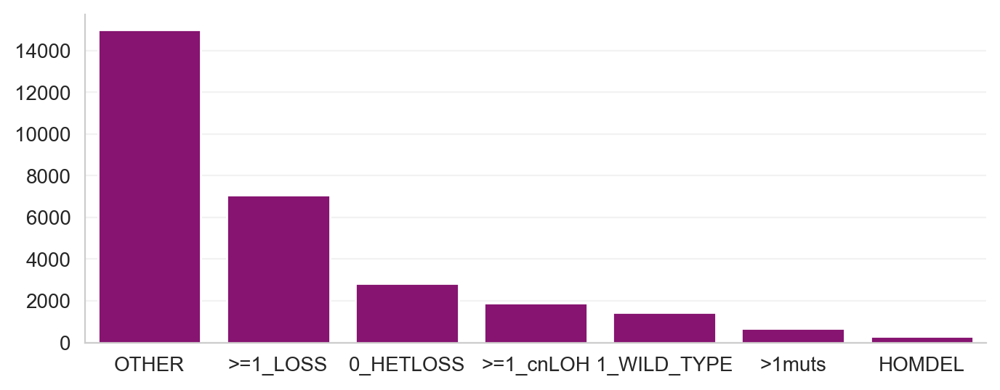

In [29]:
count = get_groupby(master, 'tp53_group', 'count')
count.loc['OTHER'] = [len(master) - int(get_groupby(master, 'tp53_group', 'count').sum())]
count = count.sort_values(by=['count'], ascending=False)
display(count)
get_ploth('count', count.index, count, '', '', '',color=plt.cm.RdPu(0.8), figsize=(8,3), perc=False)
plt.show()

---
* **What percentage of the tp53 samples do they represent?**

,count
tp53_group,
1_WILD_TYPE,1457
>1muts,697
>=1_LOSS,7087
>=1_cnLOH,1895
HOMDEL,72
OTHER,1523
0_HETLOSS,0
,%
tp53_group,


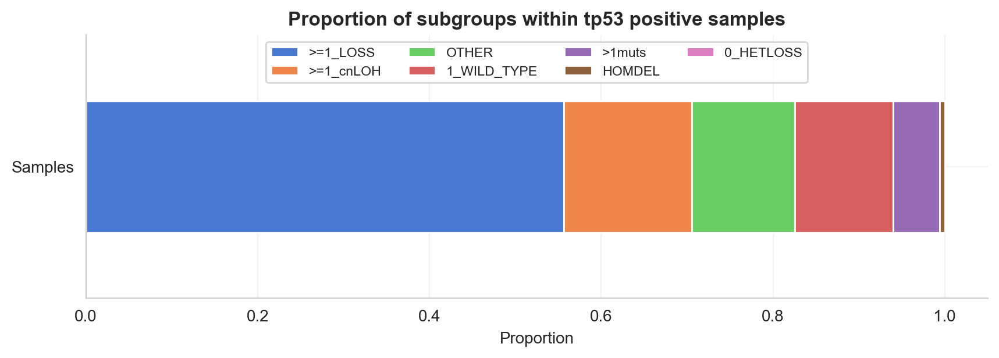

In [31]:
from itertools import cycle, islice

master_mult = filter_muts(master, [1,2,3,4,5])

# We verify that our notebooks 
assert( len(master_mult) == master_mult.tp53_group.isna().sum() + int(get_groupby(master_mult, 'tp53_group', 'count').sum()))

count = get_groupby(master_mult, 'tp53_group', 'count')
count.loc['OTHER'] = [len(master_mult) - int(get_groupby(master_mult, 'tp53_group', 'count').sum())]
count.loc['0_HETLOSS'] = [0]

freq = pd.DataFrame(count['count']).sort_values(by=['count'], ascending=False)/ pd.DataFrame(count['count']).sum()
freq.columns=['%']
display_side_by_side(count, round(100*freq,1))

#Plotting it
fig, ax = plt.subplots()
my_colors = list(islice(cycle(list(sns.color_palette("muted"))), None, len(count)))
freq.T.plot(kind = 'barh', stacked=True, figsize = (10,3), ax=ax, yticks=[], color=my_colors)
plt.title('Proportion of subgroups within tp53 positive samples', weight = 'bold')
plt.legend(loc = 'upper center', fontsize='small', ncol=4)
ax.yaxis.set_major_formatter(matplotlib.ticker.IndexFormatter(['Samples']))
ax.spines['right'].set_visible(False)
ax.set_xlabel('Proportion')
ax.spines['top'].set_visible(False)
plt.show()

---
What cn_state are present in the OTHER subgroup, and what is the number of people?

,count,%
tp53_cn_state,,
INDETERMINATE,1211,79.6
DOUBLE LOSS AFTER,107,7.0
CNLOH & GAIN,61,4.0
GAIN,56,3.7
CNLOH AFTER,43,2.8
LOSS & GAIN,15,1.0
AMP,12,0.8
AMP (LOH),12,0.8
AMP (BALANCED),4,0.3


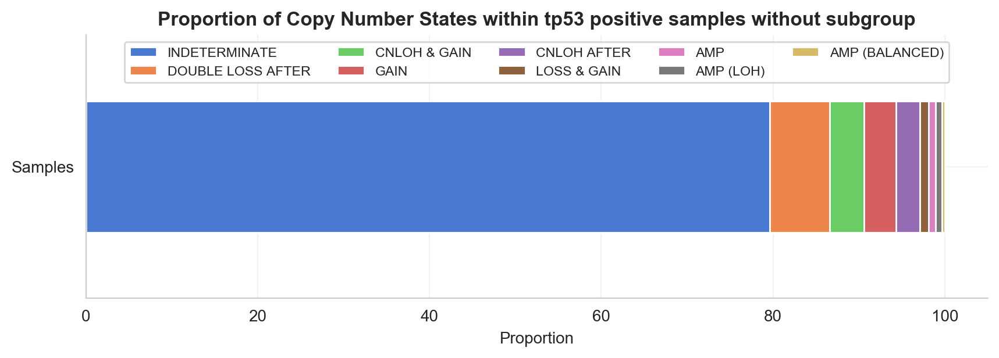

In [32]:
master_mult = filter_muts(master, [1,2,3,4,5])
master_mult = filter_general(master_mult, 'tp53_group',[None])
count = get_groupby(master_mult, 'tp53_cn_state', 'count').sort_values(by=['count'], ascending=False)
count['%'] = round(100*pd.DataFrame(count['count']).sort_values(by=['count'], ascending=False)/ pd.DataFrame(count['count']).sum(),1)
#freq.columns = ['%']
display(count)

#Plotting it
fig, ax = plt.subplots()
my_colors = list(islice(cycle(list(sns.color_palette("muted"))), None, len(count)))
count[['%']].T.plot(kind = 'barh', stacked=True, figsize = (10,3), ax=ax, yticks=[], color=my_colors)
plt.title('Proportion of Copy Number States within tp53 positive samples without subgroup', weight = 'bold')
plt.legend(loc = 'upper center', fontsize='small', ncol=5)
ax.yaxis.set_major_formatter(matplotlib.ticker.IndexFormatter(['Samples']))
ax.spines['right'].set_visible(False)
ax.set_xlabel('Proportion')
ax.spines['top'].set_visible(False)
plt.show()


## Individual Group - TP53 State Description

The following plots describe the different subgroups we created.
* *nb_muts_density*: nb of tp53 mutations we select to plot the densities (vaf, ccf, purity)
* *nb_muts_scatter*: nb of tp53 mutations we select to plot the scatters (VAF1/VAF2 and CCF1/CCF2) (0 means no plot because no multiple mutations)
* *mut_cn_group*: condition parameter to plot (not important)

**NB**: For now, 0_HETLOSS does not have anything because the subgroup does not include any tp53 mutation, same for HOMDEL. Tomorrow (Wednesday) I will compute visual summaries for them.

,count
tp53_cn_state,
HETLOSS,3352
LOSS BEFORE,2872
LOSS BEFORE & AFTER,203
,count
Cancer_Type,
Colorectal Cancer,1269
Non-Small Cell Lung Cancer,996
Breast Cancer,921
Pancreatic Cancer,565


<Figure size 600x600 with 0 Axes>

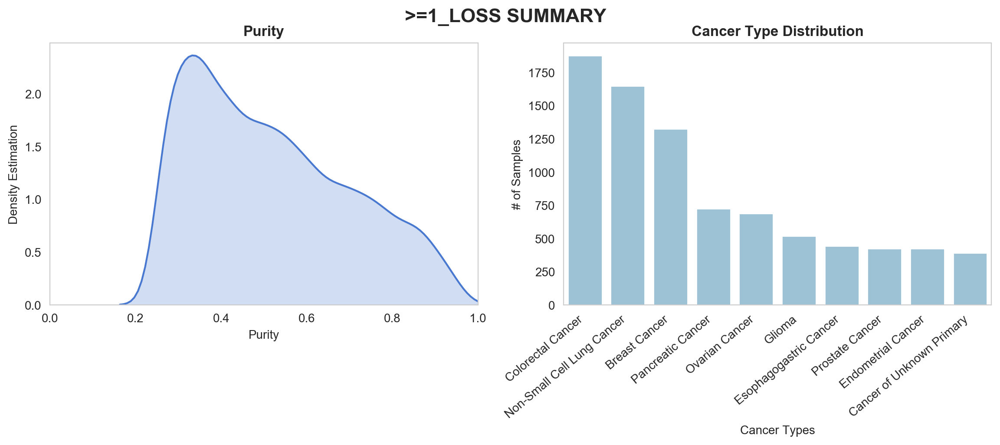

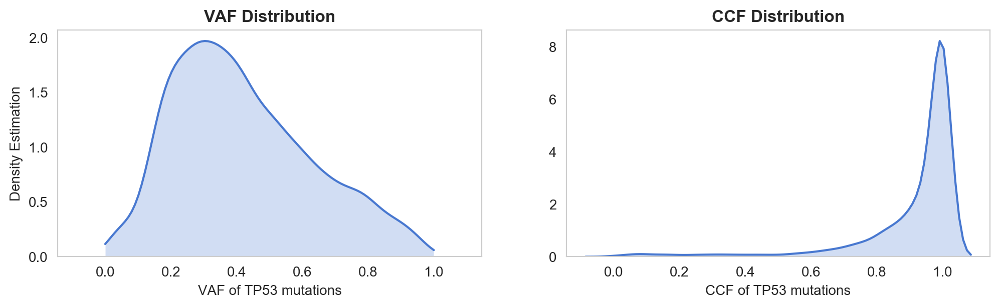

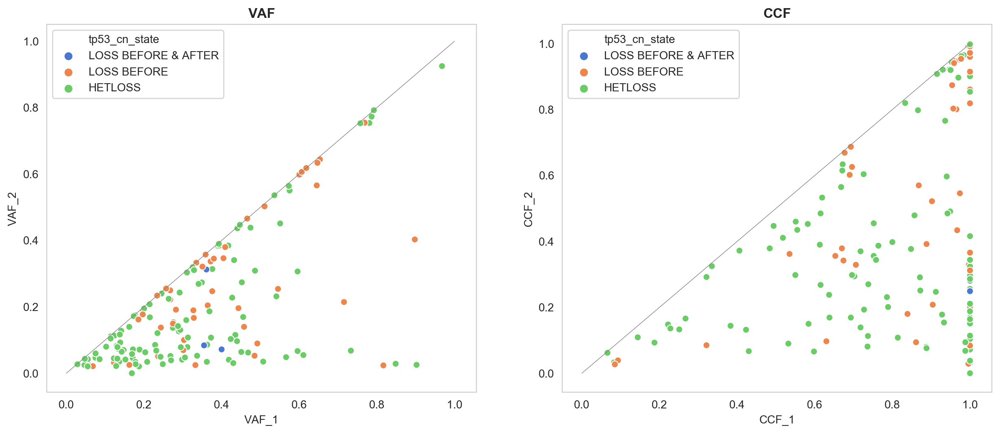

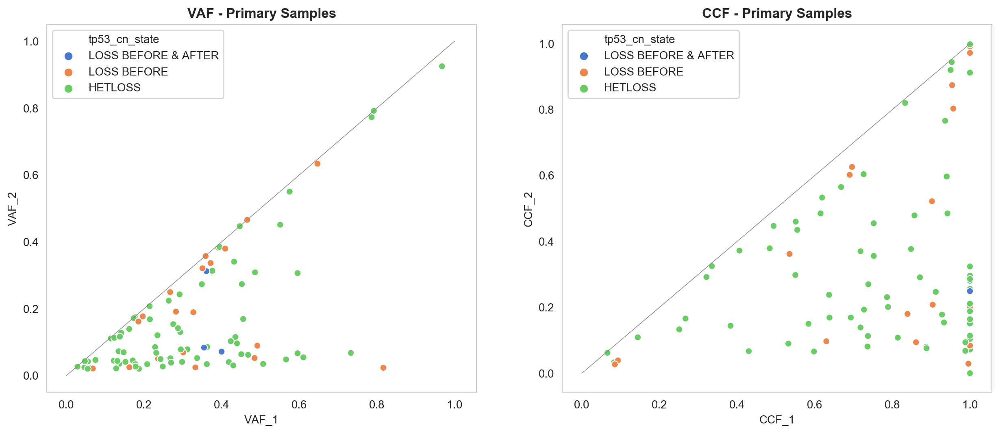

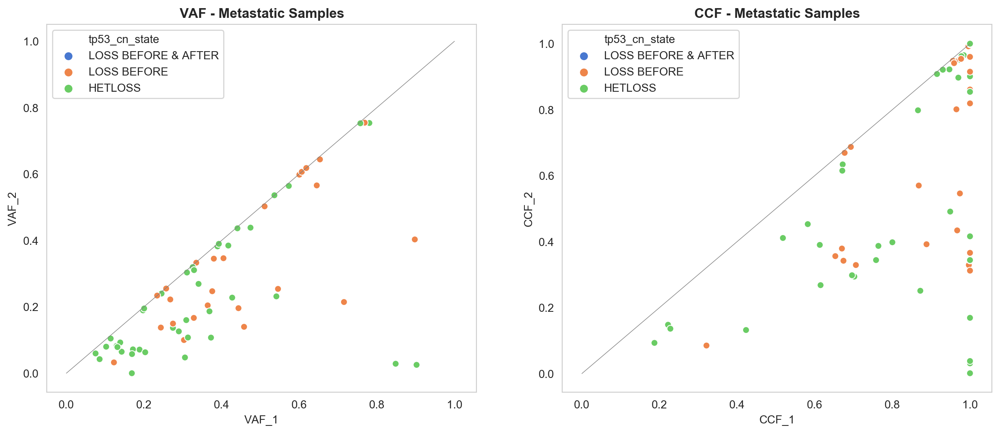

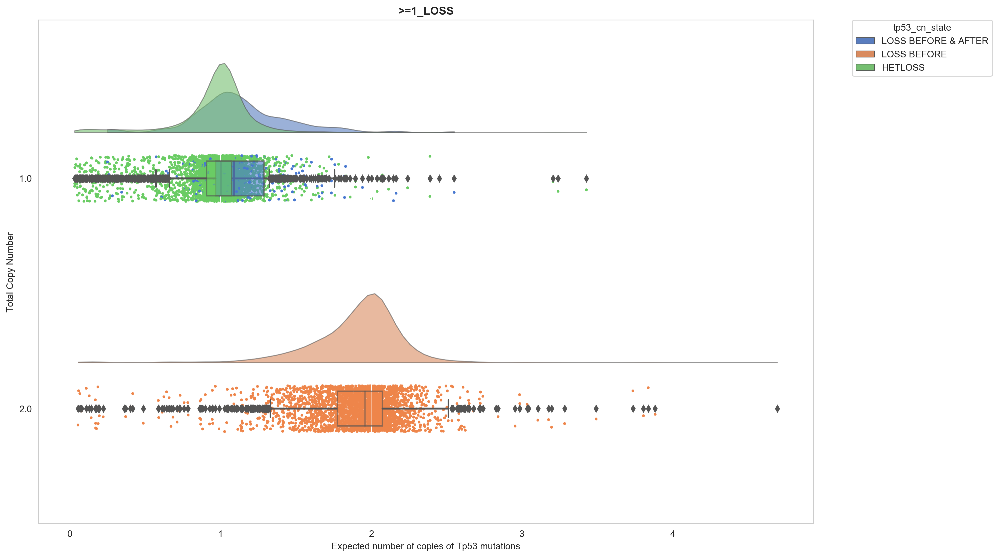

In [43]:
plot_summary(group=['>=1_LOSS'],group_name='>=1_LOSS',nb_muts_density=[1,2,3],nb_muts_scatter=[2,3], mut_cn_group=True, sample_type=True)

,count
tp53_cn_state,
CNLOH,671
CNLOH BEFORE,166
CNLOH BEFORE & GAIN,25
CNLOH BEFORE & LOSS,814
,count
Cancer_Type,
Non-Small Cell Lung Cancer,294
Colorectal Cancer,242
Breast Cancer,210


<Figure size 600x600 with 0 Axes>

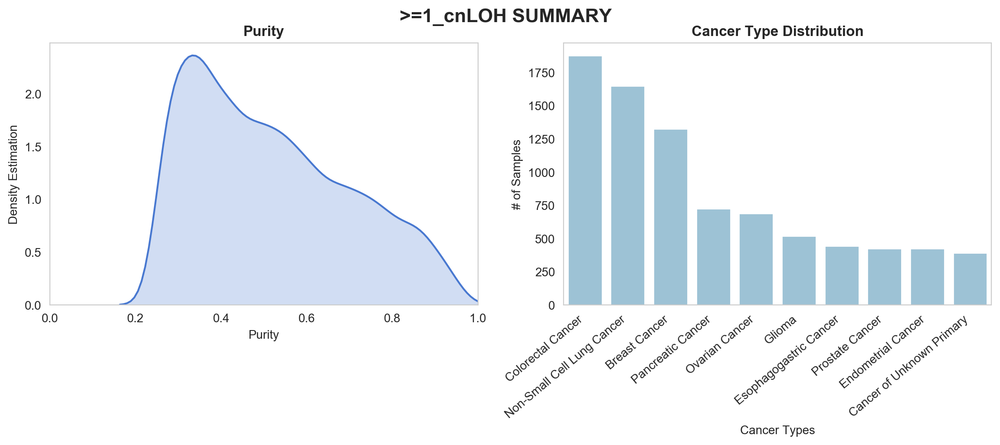

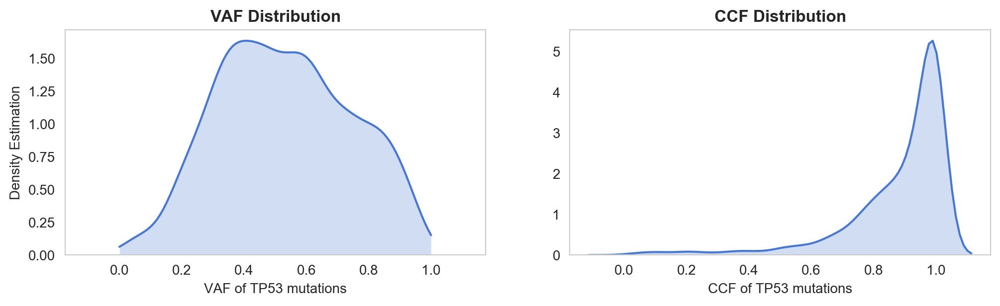

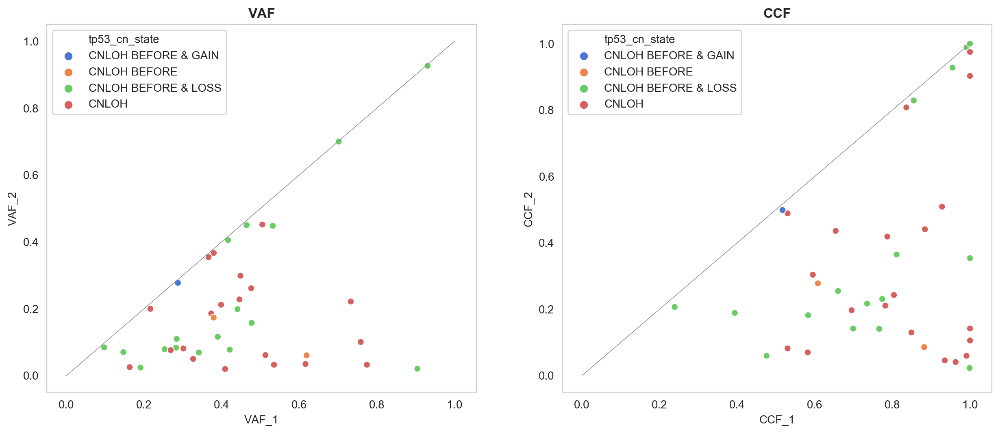

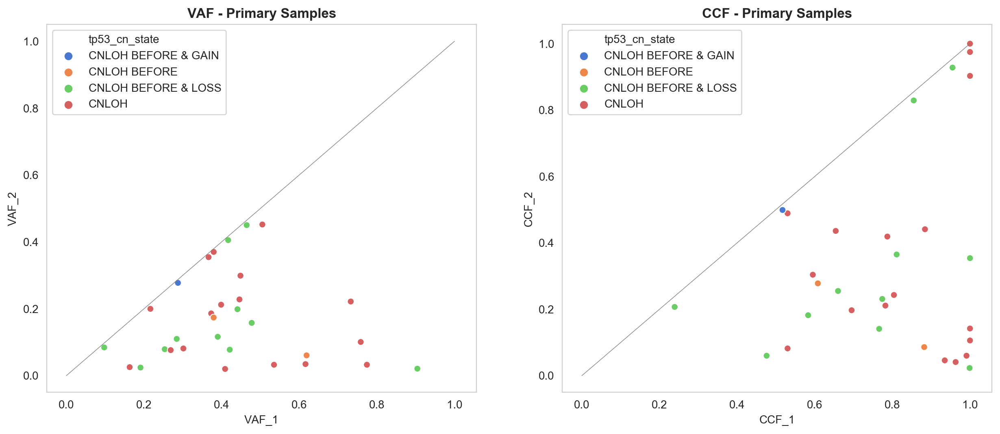

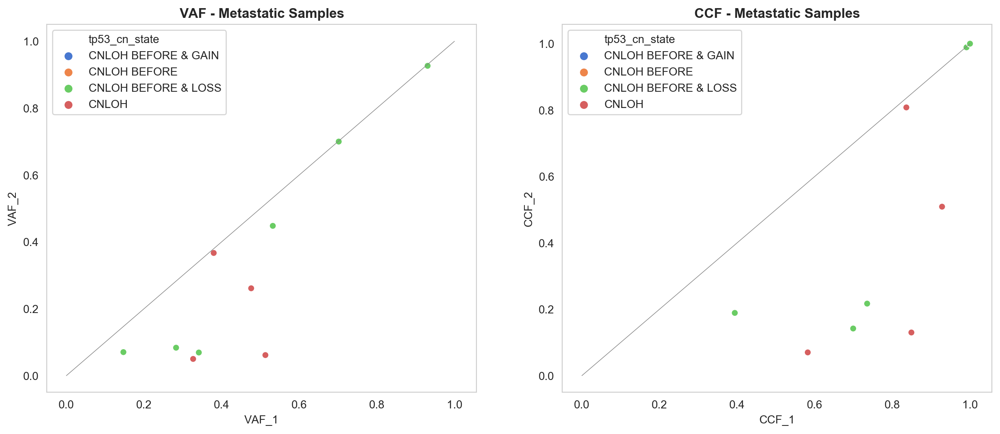

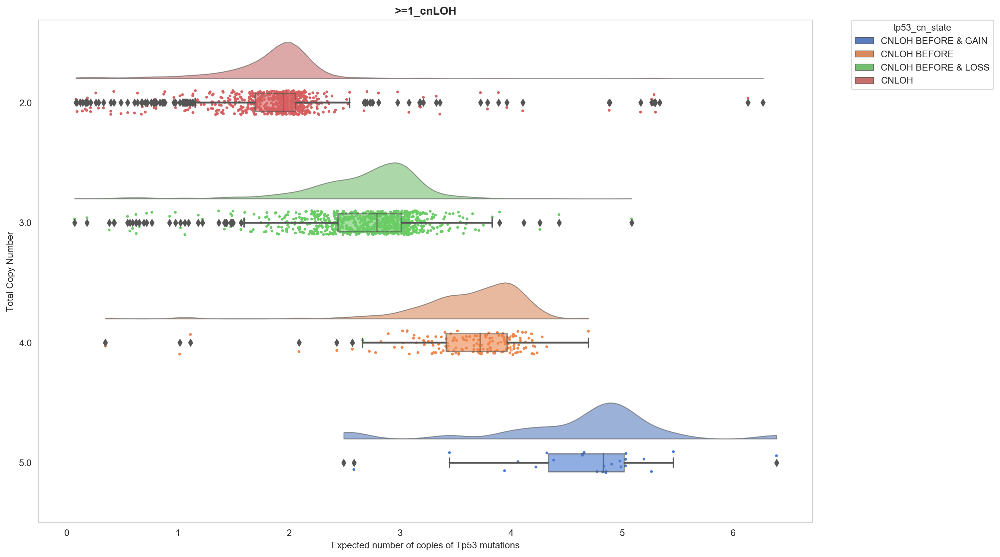

In [44]:
plot_summary(group=['>=1_cnLOH'],group_name='>=1_cnLOH',nb_muts_density=[1,2,3], nb_muts_scatter=[2,3], mut_cn_group=True, sample_type=True)

,count
tp53_cn_state,
DIPLOID,517
LOSS AFTER,65
TETRAPLOID,19
,count
Cancer_Type,
Colorectal Cancer,93
Non-Small Cell Lung Cancer,82
Glioma,78
Endometrial Cancer,33


<Figure size 600x600 with 0 Axes>

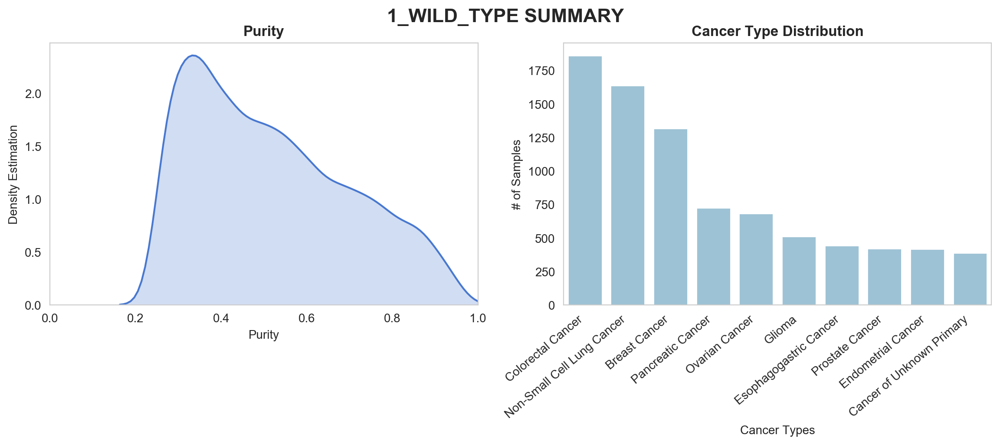

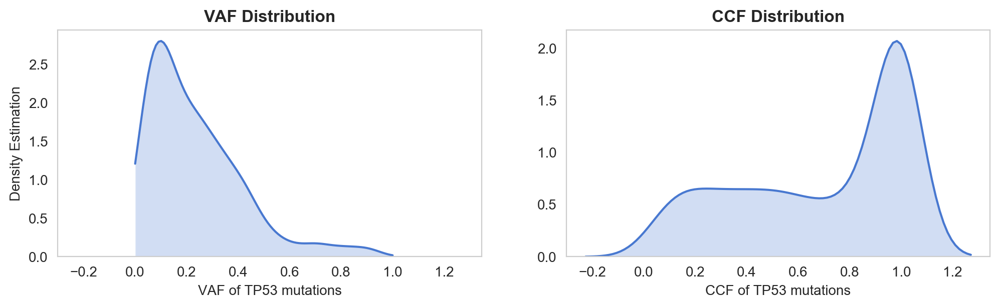

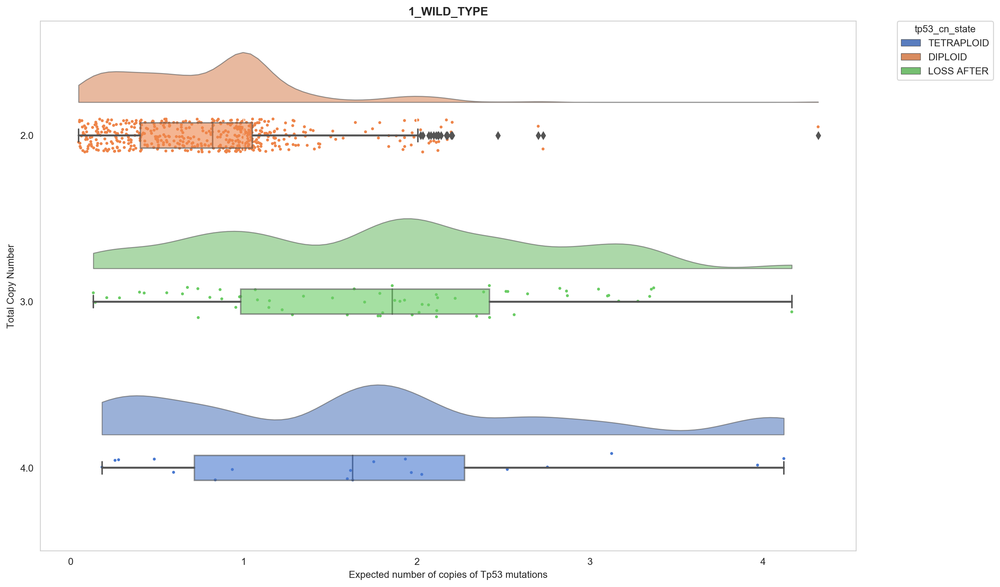

In [45]:
plot_summary(group=['1_WILD_TYPE'],group_name='1_WILD_TYPE',nb_muts_density=[1, 2],nb_muts_scatter=0, mut_cn_group=True, sample_type=True)

,count
tp53_cn_state,
DIPLOID,387
DOUBLE LOSS AFTER,39
GAIN,33
LOSS AFTER,95
TETRAPLOID,48
,count
Cancer_Type,
Glioma,99
Colorectal Cancer,97


<Figure size 600x600 with 0 Axes>

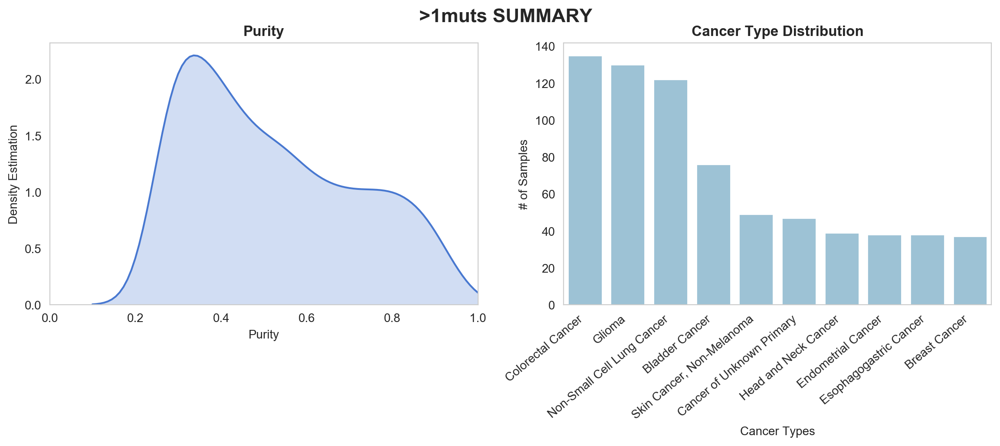

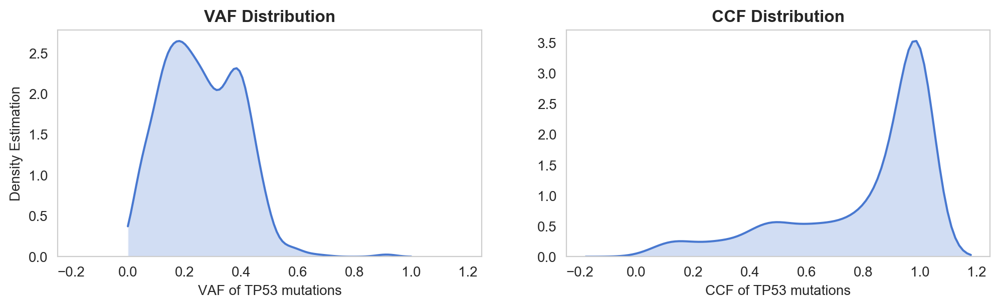

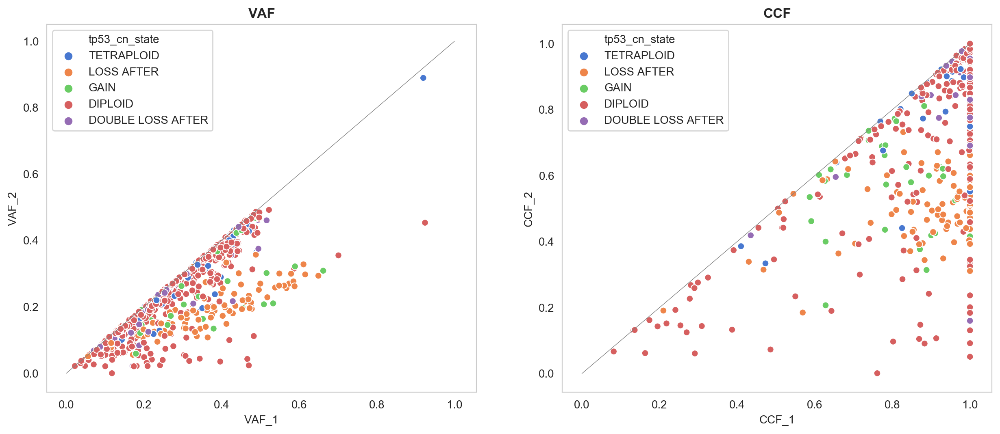

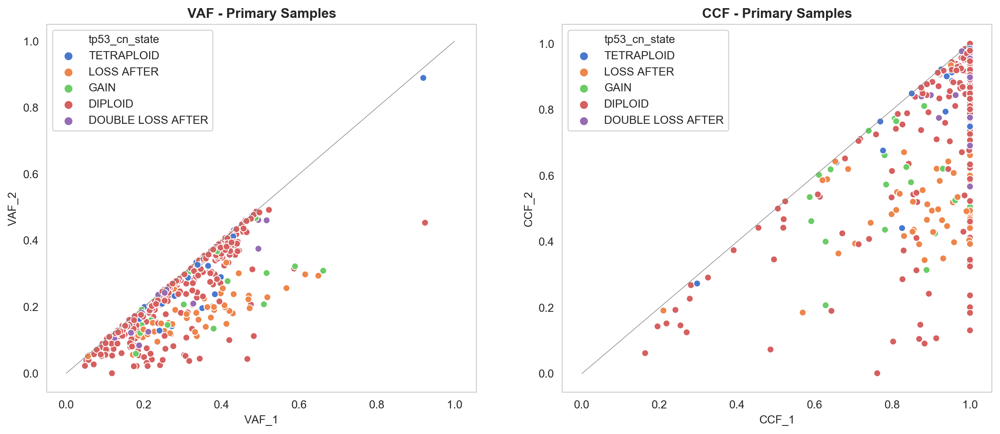

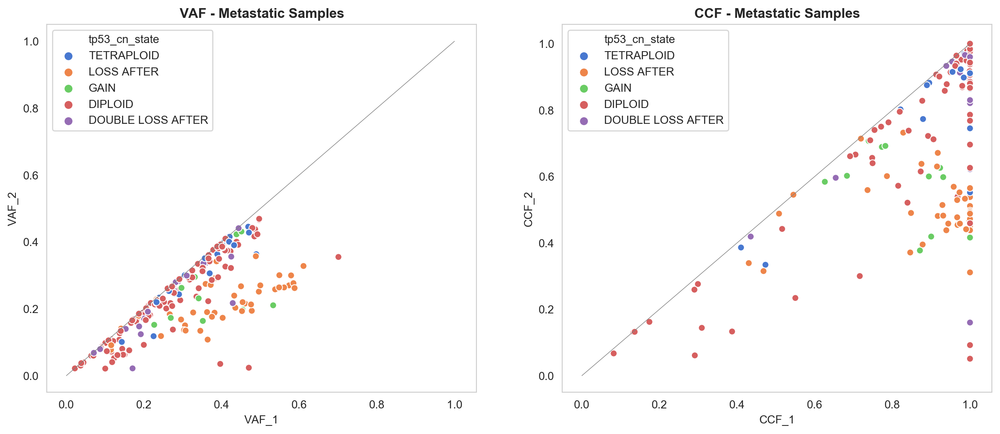

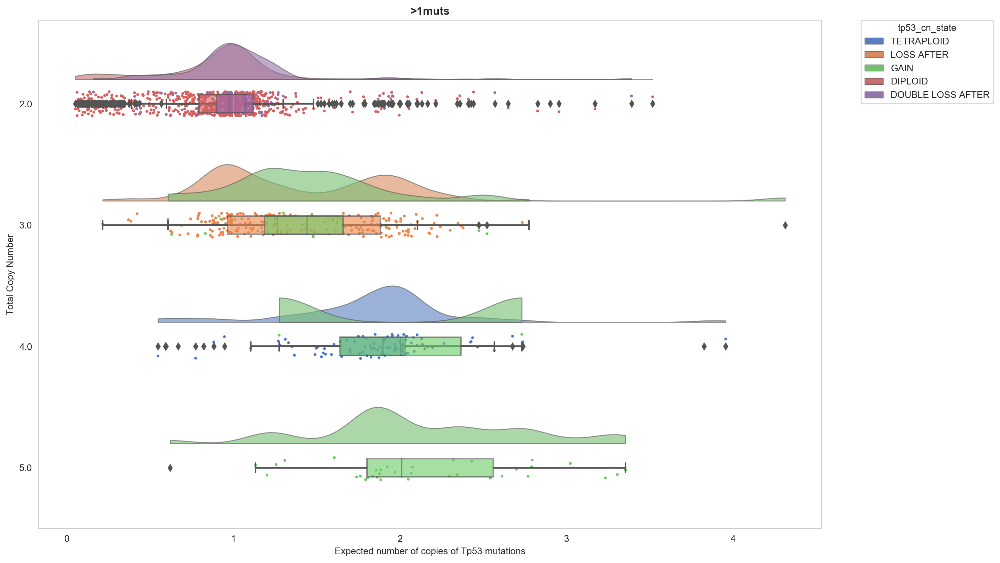

In [46]:
plot_summary(group=['>1muts'],group_name='>1muts',nb_muts_density=[2,3,4,5],nb_muts_scatter=[2,3,4,5], mut_cn_group=True, sample_type=True)

,count
tp53_cn_state,
HOMDEL,72
,count
Cancer_Type,
Prostate Cancer,14
Colorectal Cancer,10
Breast Cancer,9
Pancreatic Cancer,7
Non-Small Cell Lung Cancer,6
Bladder Cancer,3


<Figure size 600x600 with 0 Axes>

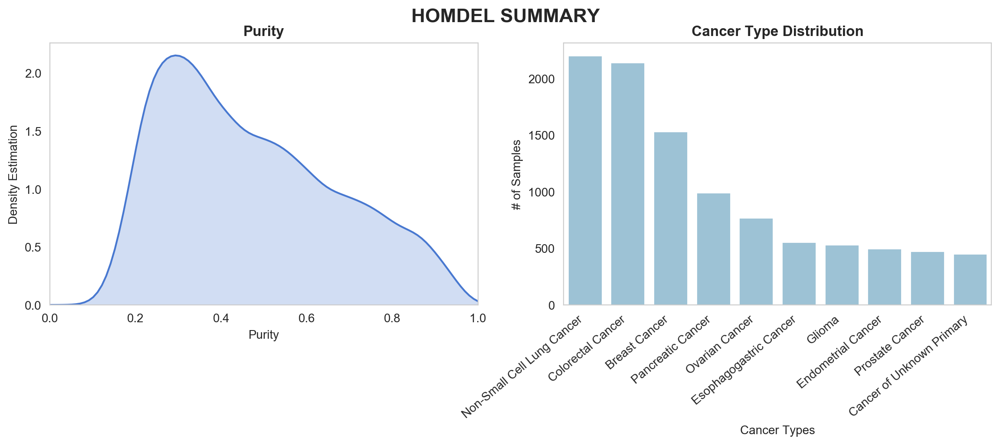

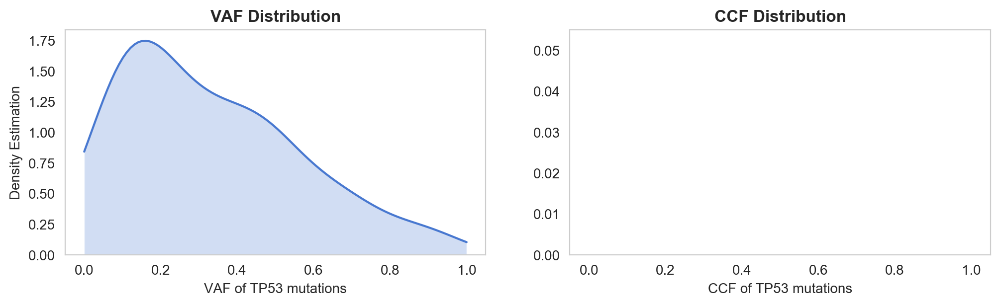

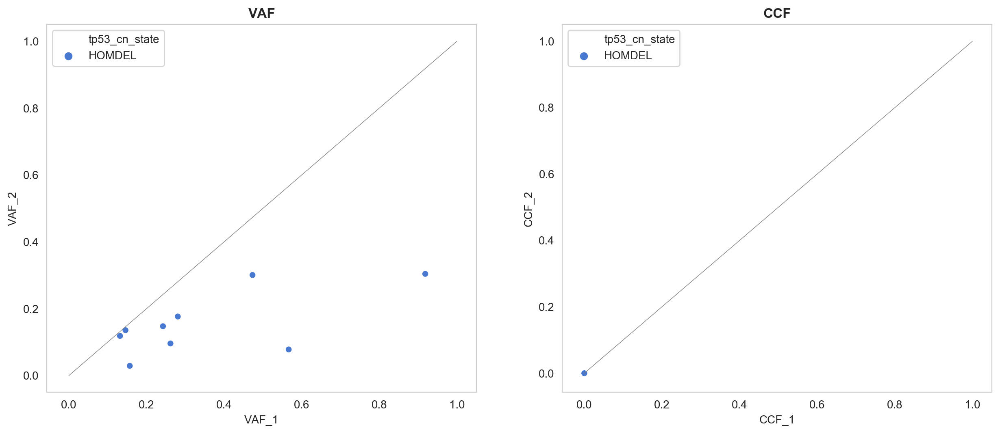

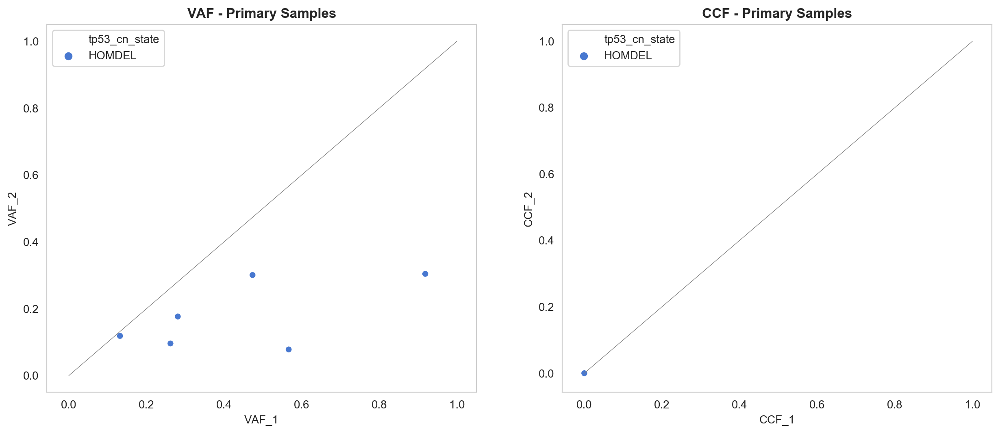

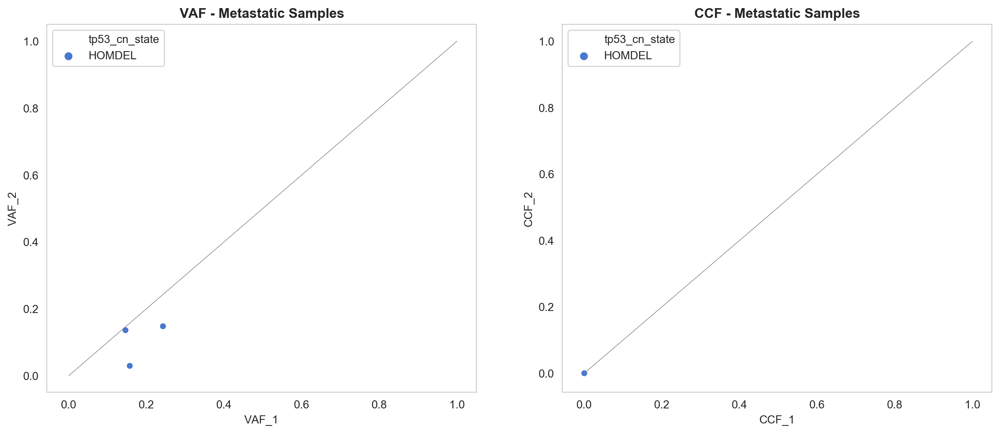

ValueError: There must be at least two hue levels to use `split`.'

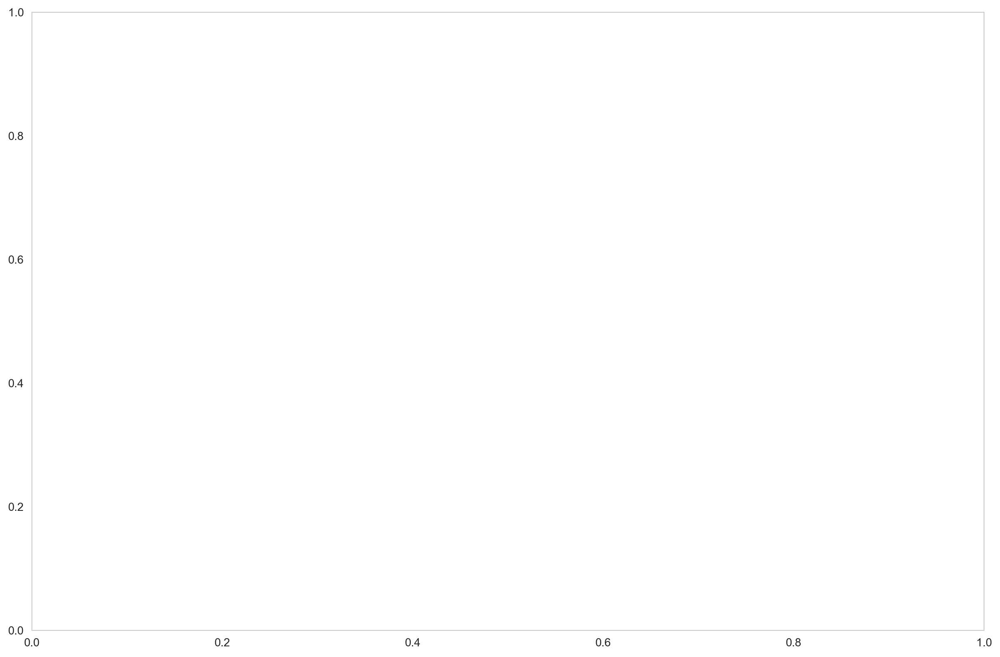

In [37]:
plot_summary(group=['HOMDEL'],group_name='HOMDEL',nb_muts_density=[1,2,4],nb_muts_scatter=[2,3,4,5], mut_cn_group=True, sample_type=True)

Text(0.5, 0, 'Expected Number of TP53 mutant copies')

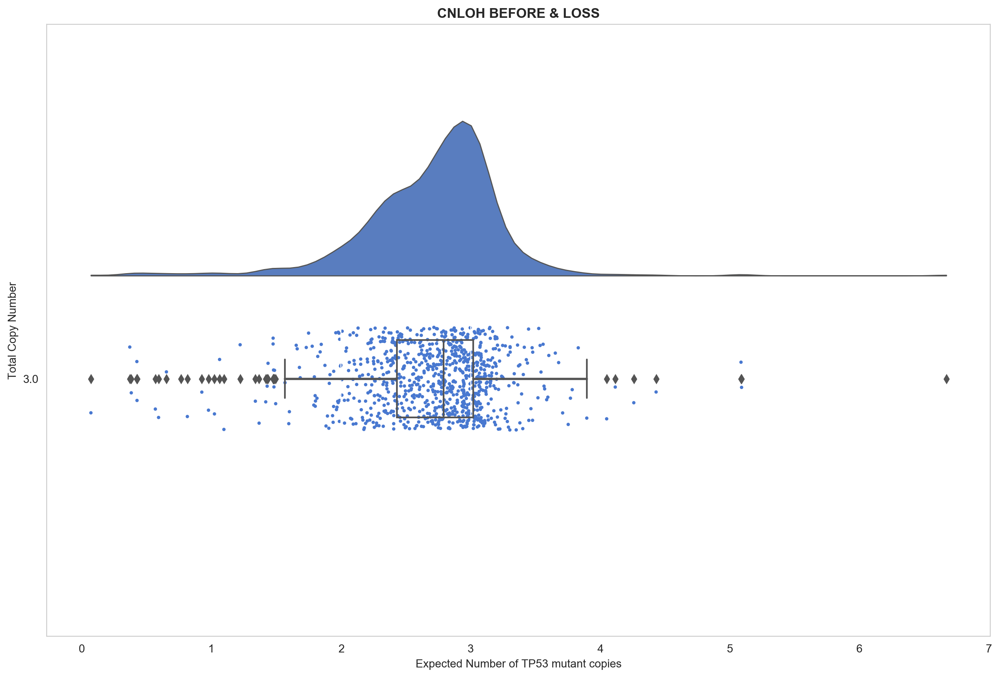

In [40]:
master_demo = master[master['tp53_cn_state'] == 'CNLOH BEFORE & LOSS']
dx="tp53_tcn"; dy="tp53_exp_nb_1"; ort="h"; pal = "muted"; dhue = "tp53_cn_state"
f, ax = plt.subplots(figsize=(15, 10))

pt.RainCloud(x = dx, y = dy, data = master_demo, palette = pal,
                 width_viol = .6, ax = ax, orient = ort)

plt.title("CNLOH BEFORE & LOSS", weight='bold')
plt.ylabel('Total Copy Number')
plt.xlabel('Expected Number of TP53 mutant copies')